# Food insecurity in NYC - Pedro Espino

https://sites.google.com/view/pilambdaepsilon/data

“The luring of a supermarket to a food desert is a one-dimensional approach to a complex problem,” noted a 2016 article in Progressive Planning. “While a new store will increase geographic proximity, it does nothing to address the structural drivers of food insecurity, like poverty, low wages, food pricing, segregated land-uses and inadequate and inequitable transportation options.”

https://www.nycfoodpolicy.org/losing-grocery-store-changes-neighborhood/

In [525]:
#set up a flag for verbosity throughout the notebook
verbose=False

In [32]:
import matplotlib.pyplot as plt
from matplotlib import rc
import matplotlib
from matplotlib import rcParams
from matplotlib.patches import Circle
import matplotlib.colorbar as cbar
import pylab
import os
import time
import math
from os.path import exists
from matplotlib.pyplot import figure
import numpy.ma as ma
import pandas
import numpy as np
import cmasher as cmr

#from matplotlib import pyplot

from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
from shapely import geometry
from shapely.geometry import Point, MultiPoint
from shapely.geometry import MultiPolygon, Polygon
import shapely.wkt
import random
from datetime import datetime

import geocoder
#please reach out to Pedro Espino (pe7868@princeton.edu) for instructions on obtaining a Bing maps API key
API_key=""

#URL parsing tings
import re
from urllib.request import Request, urlopen

def get_page_content(url, head):

    req = Request(url, headers=head)
    return urlopen(req)
head = {
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_6) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/99.0.4844.84 Safari/537.36",
    "Accept": "text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9",
    "Accept-Charset": "ISO-8859-1,utf-8;q=0.7,*;q=0.3",
    "Accept-Encoding": "none",
    "Accept-Language": "en-US,en;q=0.8",
    "Connection": "keep-alive",
    "refere": "https://example.com",
    "cookie": """your cookie value ( you can get that from your web page) """,
}

universal_fontsize=20
universal_linewidth=2

rcParams.update({'figure.autolayout': True})
matplotlib.rc('text', usetex = True)
matplotlib.rc('font', **{'family': 'serif', 'serif':['Computer Modern'], 'size':11})
matplotlib.rcParams['text.latex.preamble']=r"\usepackage{amsmath,amssymb}"
matplotlib.rcParams['xtick.minor.size'] = 1
matplotlib.rcParams['xtick.minor.width'] = 1
matplotlib.rcParams['xtick.labelsize'] = universal_fontsize
matplotlib.rcParams['ytick.labelsize'] = universal_fontsize
matplotlib.rc('legend', fontsize=universal_fontsize)

%matplotlib inline

### get all NYC zipcodes - useful for things later on

In [2]:
zipcode_dataframe = pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/Modified_Zip_Code_Tabulation_Areas__MODZCTA__20240229.csv')

ZCTA = np.asarray(zipcode_dataframe['ZCTA'])
NYC_ZIPCODES=[]
for i in range(0, len(ZCTA)-1):
    for j in range(0, len(ZCTA[i].split(','))):
        zipcode=ZCTA[i].split(',')[j].strip()
        NYC_ZIPCODES.append(zipcode)

### find all bus stops for a particular bus line in The Bronx by parsing bustime.mta.info

In [3]:
#TODO: (Do it once) turn these addresses into longitude and latitude positions using Bing maps API, 
#save that dataset so you don't have to query Bing anymore
Bx_routes = ['1','2','3','4','4A','5','6','7','8','9','10','11','12','13','15','16','17','18A','18B',
            '19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35','36',
             '38','39','40','41','42','46']
BUSSTOPS=[[],[]]
for bri in range(0, 1):
#for bri in range(0, len(Bx_routes)):
    print("ROUTE: Bx%s"%Bx_routes[bri])
    url="https://bustime.mta.info/m/?q=Bx%s"%Bx_routes[bri]
    #url="https://bustime.mta.info/m/?q=Bx1"
    page = urlopen(url)
    html_bytes = page.read()
    html = html_bytes.decode("utf-8")
    title_split = html.split('title=')
    for i in range(1, len(title_split)):
        stop_string=title_split[i].split(">")[0][1:-1]
        if stop_string != "":
            BUSSTOPS[0].append(Bx_routes[bri])
            BUSSTOPS[1].append(stop_string)
            #print(stop_string)
    #print("")
#print(BUSSTOPS[0], BUSSTOPS[1])

ROUTE: Bx1


### parse supermarketpage.com for the names and addresses of all NYC area supermarkets

In [524]:
metasite_url = "http://supermarketpage.com/state/NY/"

query_bing=0
metasites_data = get_page_content(metasite_url,head).read()
#print(metasites_data)
metasites_data_html = metasites_data.decode("utf-8")
metasites_data_html_bytes = metasites_data_html.split('href="')
#print(metasites_data_html_bytes)
supermarket_websites=[]
SUPERMARKET_ADDRESSES_web=[]
SUPERMARKET_ZIPCODES_web=[]
SUPERMARKET_ADDNUMS_web=[]
SUPERMARKET_COORDS_web=[]
print("parsing list of supermarkets from the web")
for i in range(0, len(metasites_data_html_bytes)):
#for i in range(0, 90):
    nested_site=metasites_data_html_bytes[i].split('>')[0][:-1]
    #print(nested_site[-3:])
    if(nested_site[-3:]=='htm'):
        #print(nested_site)
        supermarket_websites.append(nested_site)
        market_data = get_page_content(nested_site, head).read()
        market_html = market_data.decode("utf-8")
        market_html_bytes=market_html.split('</td><td>')
        for j in range(0, len(market_html_bytes)):
            if market_html_bytes[j]=='NY':
                zipcode=market_html_bytes[j+1]
                borough=market_html_bytes[j-1].split(' ')[-2][:-1]
                #print(boroughpre, borough)
                if zipcode in NYC_ZIPCODES:
                #if zipcode in NYC_ZIPCODES and borough=="Bronx":
                    full_address = ' '.join(map(str, [market_html_bytes[j-1], market_html_bytes[j], market_html_bytes[j+1]]))
                    #''.join(address_parsed)
                    #SUPERMARKET_ADDRESSES_web.append(address.upper())
                    SUPERMARKET_ADDRESSES_web.append(full_address.upper())
                    SUPERMARKET_ADDNUMS_web.append(full_address.split(' ')[0])
                    SUPERMARKET_ZIPCODES_web.append(zipcode)
                    if(verbose):
                        print(full_address)
                    if(query_bing==1):
                        print("Querying Bing...")
                        geocode_bing = geocoder.bing('%s'%full_address, key=API_key)
                        try:
                            checktype = geocode_bing.type
                            print("COULD NOT FIND ADDRESS COORDINATES... USING DEFAULT ADDRESS")
                            long_lat_mont = [-73.89523018917087, 40.847372509635]
                        except:
                            latlong_results = geocode_bing.json
                            long_lat_mont = [latlong_results['lng'], latlong_results['lat']]
                            if(verbose):
                                print("ADDRESS COORDS: ", latlong_results['lat'], latlong_results['lng'], '\n')
                        SUPERMARKET_COORDS_web.append([long_lat_mont[1], long_lat_mont[0]])
                        
                    if verbose:
                        print("")
                    #print(market_html_bytes[j-1], "===", market_html_bytes[j], "===", market_html_bytes[j+1])
                    #print(full_address)
#print(len(SUPERMARKET_ADDRESSES_web), SUPERMARKET_ADDNUMS_web)
print("Done", len(SUPERMARKET_ADDRESSES_web))

parsing list of supermarkets from the web
Done 576


### import the list of supermarketpage coordinates and zipcodes

In [4]:
SUPERMARKET_COORDS_web=[]
SUPERMARKET_ZIPCODES_web=[]
SUPERMARKET_ADDRESSES_web=[]
supermarketpage_file='/home/pedro/Singularity/Desktop/DS/FoodDeserts/SUPERMARKET_ADDRESSES_AND_COORDINATES_WEB'
SUPERMARKET_COORDS_long, SUPERMARKET_COORDS_lat = np.genfromtxt(supermarketpage_file,
             usecols=(3,2), delimiter=',', unpack=True, comments="#")
f=open(supermarketpage_file,"r")
lines=f.readlines()[2:]
for x in lines:
    addline=x.split(',')[0]
    zipline=x.split(',')[1]
    loclong=x.split(',')[3]
    loclat=x.split(',')[2]
    SUPERMARKET_ZIPCODES_web.append(zipline.split(' ')[3])
    SUPERMARKET_ADDRESSES_web.append(addline)
    SUPERMARKET_COORDS_web.append([float(loclong), float(loclat)])
f.close()

#for i in range(0, len(SUPERMARKET_ADDRESSES_web)):
#    SUPERMARKET_COORDS_web.append([float(SUPERMARKET_COORDS_long[i]), float(SUPERMARKET_COORDS_lat[i])])
#    #SUPERMARKET_ZIPCODES_web.append(SUPERMARKET_ZIPCODES_unparsed[i].split(' ')[1])
#    #print(SUPERMARKET_ZIPCODES_web[i], " ", SUPERMARKET_ADDRESSES_web[i])
print(len(SUPERMARKET_ADDRESSES_web), len(SUPERMARKET_COORDS_web))

576 576


### get a list of all food stores in NYC - this includes supermarkets, bodegas, bakeries, etc.

In [526]:
foodstore_dataframe = pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/Retail_Food_Stores_20240226.csv')
print(foodstore_dataframe)
#FOODSTORE_TYPE=np.asarray(foodstore_dataframe['Operation Type'])
FOODSTORE_BORO=np.asarray(foodstore_dataframe['County'])
FOODSTORE_TYPE=np.asarray(foodstore_dataframe['Establishment Type'])
FOODSTORE_OPTYPE=np.asarray(foodstore_dataframe['Operation Type'])
FOODSTORE_LICENSE=np.asarray(foodstore_dataframe['License Number'])
FOODSTORE_DBANAME=np.asarray(foodstore_dataframe['DBA Name'])
FOODSTORE_NAME=np.asarray(foodstore_dataframe['Entity Name'])
FOODSTORE_ADDNUMS = np.asarray(foodstore_dataframe['Street Number'])
#foodstore_addnums_strings = ["%d" % number for number in FOODSTORE_ADDNUMS]
FOODSTORE_ADDNAMES=np.asarray(foodstore_dataframe['Street Name']) #+ np.asarray(foodstore_dataframe['Street Name'])
FOODSTORE_ZIPCODES=np.asarray(foodstore_dataframe['Zip Code'])
FOODSTORE_COORDS=np.asarray(foodstore_dataframe['Georeference'])
FOODSTORE_AREASQFT=np.asarray(foodstore_dataframe['Square Footage'])
NYC_FOODSTORE_ADDRESSFULL=[]
NYC_FOODSTORE_BORO=[]
NYC_FOODSTORE_ZIPCODE=[]
NYC_FOODSTORE_COORDS=[]
NYC_FOODSTORE_AREASQFT=[]
NYC_FOODSTORE_NAME=[]
NYC_FOODSTORE_DBANAME=[]
NYC_FOODSTORE_TYPE=[]
NYC_FOODSTORE_OPTYPE=[]
NYC_FOODSTORE_LICENSE=[]
#760 Melrose Ave
if(verbose):
    print(set(FOODSTORE_BORO))
    print(set(FOODSTORE_TYPE))
#print(dataframe['the_geom'][0])
for i in range(0, len(FOODSTORE_BORO)):
    #if(FOODSTORE_BORO[i]=="BRONX"):
    #if(str(FOODSTORE_ZIPCODES[i]) in NYC_ZIPCODES and FOODSTORE_BORO[i]=="BRONX"):
    if(str(FOODSTORE_ZIPCODES[i]) in NYC_ZIPCODES):
        #if
        NYC_FOODSTORE_ADDRESSFULL.append("%s %s" %(FOODSTORE_ADDNUMS[i], FOODSTORE_ADDNAMES[i]))
        NYC_FOODSTORE_BORO.append(FOODSTORE_BORO[i])
        NYC_FOODSTORE_ZIPCODE.append(FOODSTORE_ZIPCODES[i])
        NYC_FOODSTORE_COORDS.append([float(FOODSTORE_COORDS[i].split(' ')[1][1:]),float(FOODSTORE_COORDS[i].split(' ')[2][:-1])])
        NYC_FOODSTORE_AREASQFT.append(FOODSTORE_AREASQFT[i])
        NYC_FOODSTORE_NAME.append(FOODSTORE_NAME[i])
        NYC_FOODSTORE_DBANAME.append(FOODSTORE_DBANAME[i])
        NYC_FOODSTORE_TYPE.append(FOODSTORE_TYPE[i])
        NYC_FOODSTORE_OPTYPE.append(FOODSTORE_OPTYPE[i])
        NYC_FOODSTORE_LICENSE.append(FOODSTORE_LICENSE[i])
        if(verbose):
            print(FOODSTORE_BORO[i], FOODSTORE_DBANAME[i], FOODSTORE_TYPE[i], "---", FOODSTORE_ADDNUMS[i], 
                  FOODSTORE_ADDNAMES[i], "---", FOODSTORE_ZIPCODES[i])
        #replace "AVs" with "AVEs" and so on
        #print("%s %s" %(FOODSTORE_ADDNUMS[i], FOODSTORE_ADDNAMES[i]), [float(FOODSTORE_COORDS[i].split(' ')[1][1:]),float(FOODSTORE_COORDS[i].split(' ')[2][:-1])])
print("Done", len(NYC_FOODSTORE_ADDRESSFULL))

         County  License Number Operation Type Establishment Type  \
0      ONONDAGA          760190          Store                  A   
1        NASSAU          760141          Store                  A   
2        ALBANY          760133          Store                  A   
3      COLUMBIA          760128          Store                  A   
4        QUEENS          760120          Store                  A   
...         ...             ...            ...                ...   
24191    ALBANY           10086          Store               JABC   
24192    ALBANY           10070          Store               JABC   
24193    ALBANY           10066          Store                JAC   
24194    ALBANY           10056          Store                JAC   
24195    ALBANY           10008          Store                JAC   

                                Entity Name                    DBA Name  \
0                       DOLGEN NEW YORK LLC       DOLLAR GENERAL #30401   
1                   B

### make list of bodegas and fresh-food markets from NYC Open Data

11358
DALILAS FOOD MARKET INC - DALILA'S FOOD MARKET --- 126 E 103RD ST. 20000 759464 JAC Store
C&R FOOD CORP - FINE FARE SUPERMARKET --- 708 E TREMONT AVE 14000 602229 JAC Store
1312 {'JACH', 'JABC', 'JABCD', 'JABCK', 'JABCH', 'JACK', 'JAC', 'JACD'} {'Store'}
[0.86610784 0.12437698 0.00792932 0.00090621] 4414 0
[0.51295732 0.21570122 0.16996951 0.05106707] 1312
3.364329268292683


(1.0, 10000.0)

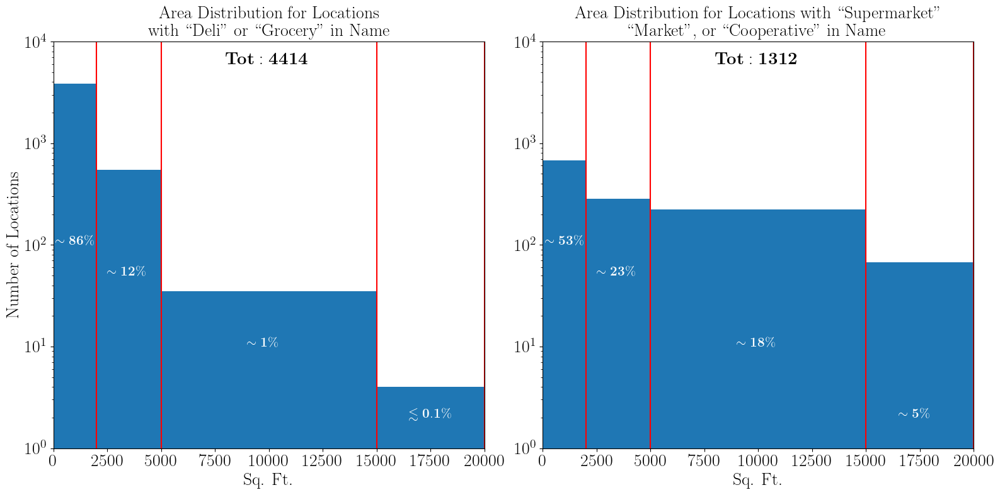

In [6]:
#hfig = plt.figure(1, figsize=(8,8))
#hax = hfig.add_subplot(111)
hfig, hax= plt.subplots(nrows=1, ncols=2,figsize=(16,8))

print(len(NYC_FOODSTORE_ADDRESSFULL))
dummy=0
FFSSIZEDIST=[]
FFSTYPEDIST=[]
FFSOPTYPEDIST=[]
FFS_COORDS_NYCOD=[]
BODEGASIZEDIST=[]
BODEGATYPEDIST=[]
BODEGAOPTYPEDIST=[]
BODEGA_COORDS_NYCOD=[]
acceptable_types=['JACD', 'JACK', 'JABC', 'JABCK', 'JABCD', 'JAC', 
                  'JAD', 'JACH', 'JABCH', 'JABHK', 'JACDK']
for i in range(0, len(NYC_FOODSTORE_ADDRESSFULL)):
#    sqftg=NYC_FOODSTORE_AREASQFT[i]
#    #if sqftg >=10000:
#    #    print(NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_NAME[i], NYC_FOODSTORE_AREASQFT[i])
    dbaname=NYC_FOODSTORE_DBANAME[i]
    storename=NYC_FOODSTORE_NAME[i]
    storetype=NYC_FOODSTORE_TYPE[i]
    store_name_reference='\t'.join([storename, dbaname])
    #if(("DELI" in store_name_reference) and ("MARKET" in store_name_reference)):
    #    print(storename, dbaname, NYC_FOODSTORE_ADDRESSFULL[i])
    if("DELI" in dbaname or "DELI" in storename or "GROCER" in dbaname or "GROCER" in storename or "BODEG" in dbaname or "BODEG" in storename):
    #if(True):
    #if(storetype in acceptable_types):
#    if(True):
#        print(NYC_FOODSTORE_NAME[i], "-", NYC_FOODSTORE_DBANAME[i], "---", NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_AREASQFT[i], 
#      NYC_FOODSTORE_LICENSE[i], NYC_FOODSTORE_TYPE[i], NYC_FOODSTORE_OPTYPE[i])
        BODEGASIZEDIST.append(NYC_FOODSTORE_AREASQFT[i])
        BODEGATYPEDIST.append(NYC_FOODSTORE_TYPE[i])
        BODEGAOPTYPEDIST.append(NYC_FOODSTORE_OPTYPE[i])
        BODEGA_COORDS_NYCOD.append(NYC_FOODSTORE_COORDS[i])
    elif(("SUPERMARKET" in store_name_reference or "COOP" in store_name_reference or " MARKET " in store_name_reference) and storetype in acceptable_types):
    #elif("SUPERMARKET" in dbaname or "SUPERMARKET" in storename or "COOP" in dbaname or "COOP" in storename):
    #elif("SUPERMARKET" in dbaname or "SUPERMARKET" in storename or "COOP" in dbaname or "COOP" in storename):
    #if(storetype in acceptable_types):
#    if(True):
#        print(NYC_FOODSTORE_NAME[i], "-", NYC_FOODSTORE_DBANAME[i], "---", NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_AREASQFT[i], 
#      NYC_FOODSTORE_LICENSE[i], NYC_FOODSTORE_TYPE[i], NYC_FOODSTORE_OPTYPE[i])
        FFSSIZEDIST.append(NYC_FOODSTORE_AREASQFT[i])
        FFSTYPEDIST.append(NYC_FOODSTORE_TYPE[i])
        FFSOPTYPEDIST.append(NYC_FOODSTORE_OPTYPE[i])
        FFS_COORDS_NYCOD.append(NYC_FOODSTORE_COORDS[i])
        #print(storename, dbaname, NYC_FOODSTORE_ADDRESSFULL[i], storetype)
        #if('A' == NYC_FOODSTORE_TYPE[i]):
#            print(NYC_FOODSTORE_NAME[i], "-", NYC_FOODSTORE_DBANAME[i], "---", NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_AREASQFT[i], 
#                  NYC_FOODSTORE_LICENSE[i], NYC_FOODSTORE_TYPE[i], NYC_FOODSTORE_OPTYPE[i])
    #elif((" MARKET " in store_name_reference) and storetype in acceptable_types):
    #    print(storename, dbaname, NYC_FOODSTORE_ADDRESSFULL[i], storetype)
    #    dummy+=1
testind=66
print(NYC_FOODSTORE_NAME[testind], "-", NYC_FOODSTORE_DBANAME[testind], "---", NYC_FOODSTORE_ADDRESSFULL[testind], NYC_FOODSTORE_AREASQFT[testind], 
      NYC_FOODSTORE_LICENSE[testind], NYC_FOODSTORE_TYPE[testind], NYC_FOODSTORE_OPTYPE[testind])
testind=11262
print(NYC_FOODSTORE_NAME[testind], "-", NYC_FOODSTORE_DBANAME[testind], "---", NYC_FOODSTORE_ADDRESSFULL[testind], NYC_FOODSTORE_AREASQFT[testind], 
      NYC_FOODSTORE_LICENSE[testind], NYC_FOODSTORE_TYPE[testind], NYC_FOODSTORE_OPTYPE[testind])
print(len(FFSSIZEDIST), set(FFSTYPEDIST), set(FFSOPTYPEDIST))
#largest_store=np.argmax(NYC_FOODSTORE_AREASQFT)
#print(NYC_FOODSTORE_NAME[largest_store], NYC_FOODSTORE_ADDRESSFULL[largest_store], NYC_FOODSTORE_AREASQFT[largest_store])
#hax.hist(NYC_FOODSTORE_AREASQFT, bins=50)
hist, bin_edges = np.histogram(BODEGASIZEDIST, bins=[0,2000,5000,15000,20000])
print(hist/len(BODEGASIZEDIST), len(BODEGASIZEDIST), dummy)
hist, bin_edges = np.histogram(FFSSIZEDIST, bins=[0,2000,5000,15000,20000])
print(hist/len(FFSSIZEDIST), len(FFSSIZEDIST))
print(len(BODEGASIZEDIST)/len(FFSSIZEDIST))
 #= np.histogram(arr, density=True)
#hax.hist(SUPERMARKETSIZEDIST, bins=500)
hax[0].hist(BODEGASIZEDIST, bins=[0,2000,5000,15000,20000])
hax[1].hist(FFSSIZEDIST, bins=[0,2000,5000,15000,20000])
hax[0].set_yscale('log')
hax[1].set_yscale('log')
#hax.set_xscale('log')
#hax.set_xticks([1e0, 1e1, 1e2, 1e3, 1e4, 1e5])
for j in range(0, 2):
    hax[j].axvline(2e3, color="red")
    hax[j].axvline(5e3, color="red")
    hax[j].axvline(15e3, color="red")
    hax[j].axvline(20e3, color="red")
    hax[j].set_xlim([0,20000])
    hax[j].set_xlabel(r"$\text{Sq. Ft.}$", fontsize=universal_fontsize)
hax[0].set_ylabel(r"$\text{Number of Locations}$", fontsize=universal_fontsize)
hax[0].set_title(r"$\text{Area Distribution for Locations}$"+'\n'+r"$\text{with ``Deli'' or ``Grocery'' in Name}$", wrap=True, fontsize = universal_fontsize)
#hax[0].set_title(r"$\text{Area Distribution for Locations with ``Deli'' or ``Grocer'' in Name}$", fontsize=universal_fontsize)
#hax[1].set_title(r"$\text{Area Distribution for Locations with ``Supermarket'', ``Market'', or ``Cooperative'' in Name}$", fontsize=universal_fontsize)
hax[1].set_title(r"$\text{Area Distribution for Locations with ``Supermarket''}$"+'\n'+r"$\text{ ``Market'', or ``Cooperative'' in Name}$", wrap=True, fontsize = universal_fontsize)
changefontsize=5
hax[0].text(1e2, 1e2, r"$\mathbf{\sim 86\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[0].text(2.5e3, 50, r"$\mathbf{\sim 12\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[0].text(9e3, 10, r"$\mathbf{\sim 1\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[0].text(16500, 2, r"$\mathbf{\lesssim 0.1 \%}$", color="white", fontsize=universal_fontsize-changefontsize)

hax[1].text(1e2, 1e2, r"$\mathbf{\sim 53\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[1].text(2.5e3, 50, r"$\mathbf{\sim 23\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[1].text(9e3, 10, r"$\mathbf{\sim 18\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[1].text(16500, 2, r"$\mathbf{\sim 5 \%}$", color="white", fontsize=universal_fontsize-changefontsize)

hax[0].text(8e3, 6e3, r"$\mathbf{Tot: %d}$" %len(BODEGASIZEDIST), color="black", fontsize=universal_fontsize)
hax[1].text(8e3, 6e3, r"$\mathbf{Tot: %d}$" %len(FFSSIZEDIST), color="black", fontsize=universal_fontsize)

hax[0].set_ylim([1e0, 1e4])
hax[1].set_ylim([1e0, 1e4])
#hax[0].text(50000, 3.25, r"test", color="white", fontsize=universal_fontsize)
#(11262) 708 E TREMONT AVE - 14000 (FINE FARE SUPERMARKET)
#(66)    126 E 103RD ST. DALILAS FOOD MARKET INC - 20000 (BODEGA)

### make list of supermarkets and all other foodstores from NYC Open Data

11358
DALILAS FOOD MARKET INC - DALILA'S FOOD MARKET --- 126 E 103RD ST. 20000 759464 JAC Store
C&R FOOD CORP - FINE FARE SUPERMARKET --- 708 E TREMONT AVE 14000 602229 JAC Store
[0.23877069 0.15839243 0.37825059 0.12056738] 423
[0.69184716 0.17767213 0.09367846 0.01989787] 11358


Text(8000.0, 6000.0, '$\\mathbf{Tot: 11358}$')

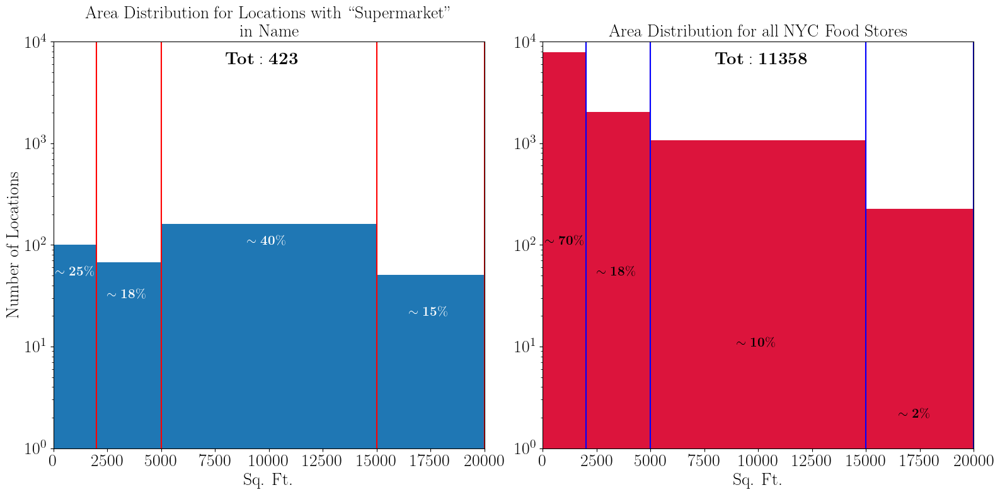

In [7]:
#hfig = plt.figure(1, figsize=(8,8))
#hax = hfig.add_subplot(111)
hfig, hax= plt.subplots(nrows=1, ncols=2,figsize=(16,8))

print(len(NYC_FOODSTORE_ADDRESSFULL))
dummy=0
SUPERMARKETSIZEDIST=[]
SUPERMARKETTYPEDIST=[]
SUPERMARKETOPTYPEDIST=[]
SUPERMARKET_COORDS_NYCOD=[]

FDSTSIZEDIST=[]
FDSTTYPEDIST=[]
FDSTOPTYPEDIST=[]
acceptable_types=['JACD', 'JACK', 'JABC', 'JABCK', 'JABCD', 'JAC', 
                  'JAD', 'JACH', 'JABCH', 'JABHK', 'JACDK']
for i in range(0, len(NYC_FOODSTORE_ADDRESSFULL)):
#    sqftg=NYC_FOODSTORE_AREASQFT[i]
#    #if sqftg >=10000:
#    #    print(NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_NAME[i], NYC_FOODSTORE_AREASQFT[i])
    dbaname=NYC_FOODSTORE_DBANAME[i]
    storename=NYC_FOODSTORE_NAME[i]
    storetype=NYC_FOODSTORE_TYPE[i]
    store_name_reference='\t'.join([storename, dbaname])
    #if(("DELI" in store_name_reference) and ("MARKET" in store_name_reference)):
    #    print(storename, dbaname, NYC_FOODSTORE_ADDRESSFULL[i])
    if(("SUPERMARKET" in store_name_reference or "COOP" in store_name_reference) and storetype in acceptable_types):
        SUPERMARKETSIZEDIST.append(NYC_FOODSTORE_AREASQFT[i])
        SUPERMARKETTYPEDIST.append(NYC_FOODSTORE_TYPE[i])
        SUPERMARKETOPTYPEDIST.append(NYC_FOODSTORE_OPTYPE[i])
        SUPERMARKET_COORDS_NYCOD.append(NYC_FOODSTORE_COORDS[i])
    if(True):
    #elif("SUPERMARKET" in dbaname or "SUPERMARKET" in storename or "COOP" in dbaname or "COOP" in storename):
    #elif("SUPERMARKET" in dbaname or "SUPERMARKET" in storename or "COOP" in dbaname or "COOP" in storename):
    #if(storetype in acceptable_types):
#    if(True):
#        print(NYC_FOODSTORE_NAME[i], "-", NYC_FOODSTORE_DBANAME[i], "---", NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_AREASQFT[i], 
#      NYC_FOODSTORE_LICENSE[i], NYC_FOODSTORE_TYPE[i], NYC_FOODSTORE_OPTYPE[i])
        FDSTSIZEDIST.append(NYC_FOODSTORE_AREASQFT[i])
        FDSTTYPEDIST.append(NYC_FOODSTORE_TYPE[i])
        FDSTOPTYPEDIST.append(NYC_FOODSTORE_OPTYPE[i])
        #print(storename, dbaname, NYC_FOODSTORE_ADDRESSFULL[i], storetype)
        #if('A' == NYC_FOODSTORE_TYPE[i]):
#            print(NYC_FOODSTORE_NAME[i], "-", NYC_FOODSTORE_DBANAME[i], "---", NYC_FOODSTORE_ADDRESSFULL[i], NYC_FOODSTORE_AREASQFT[i], 
#                  NYC_FOODSTORE_LICENSE[i], NYC_FOODSTORE_TYPE[i], NYC_FOODSTORE_OPTYPE[i])
    #elif((" MARKET " in store_name_reference) and storetype in acceptable_types):
    #    print(storename, dbaname, NYC_FOODSTORE_ADDRESSFULL[i], storetype)
    #    dummy+=1
testind=66
print(NYC_FOODSTORE_NAME[testind], "-", NYC_FOODSTORE_DBANAME[testind], "---", NYC_FOODSTORE_ADDRESSFULL[testind], NYC_FOODSTORE_AREASQFT[testind], 
      NYC_FOODSTORE_LICENSE[testind], NYC_FOODSTORE_TYPE[testind], NYC_FOODSTORE_OPTYPE[testind])
testind=11262
print(NYC_FOODSTORE_NAME[testind], "-", NYC_FOODSTORE_DBANAME[testind], "---", NYC_FOODSTORE_ADDRESSFULL[testind], NYC_FOODSTORE_AREASQFT[testind], 
      NYC_FOODSTORE_LICENSE[testind], NYC_FOODSTORE_TYPE[testind], NYC_FOODSTORE_OPTYPE[testind])
#largest_store=np.argmax(NYC_FOODSTORE_AREASQFT)
#print(NYC_FOODSTORE_NAME[largest_store], NYC_FOODSTORE_ADDRESSFULL[largest_store], NYC_FOODSTORE_AREASQFT[largest_store])
#hax.hist(NYC_FOODSTORE_AREASQFT, bins=50)
hist1, bin_edges = np.histogram(SUPERMARKETSIZEDIST, bins=[0,2000,5000,15000,20000])
print(hist1/len(SUPERMARKETSIZEDIST), len(SUPERMARKETSIZEDIST))
hist2, bin_edges = np.histogram(FDSTSIZEDIST, bins=[0,2000,5000,15000,20000])
print(hist2/len(FDSTSIZEDIST), len(FDSTSIZEDIST))
 #= np.histogram(arr, density=True)
#hax.hist(SUPERMARKETSIZEDIST, bins=500)
hax[0].hist(SUPERMARKETSIZEDIST, bins=[0,2000,5000,15000,20000])
hax[1].hist(FDSTSIZEDIST, bins=[0,2000,5000,15000,20000], color="crimson")
hax[0].set_yscale('log')
hax[1].set_yscale('log')
#hax.set_xscale('log')
#hax.set_xticks([1e0, 1e1, 1e2, 1e3, 1e4, 1e5])
for j in range(0, 2):
    hax[j].axvline(2e3, color="red")
    hax[j].axvline(5e3, color="red")
    hax[j].axvline(15e3, color="red")
    hax[j].axvline(20e3, color="red")
    hax[j].set_xlim([0,20000])
    hax[j].set_xlabel(r"$\text{Sq. Ft.}$", fontsize=universal_fontsize)
hax[1].axvline(2e3, color="blue")
hax[1].axvline(5e3, color="blue")
hax[1].axvline(15e3, color="blue")
hax[1].axvline(20e3, color="blue")
hax[0].set_ylabel(r"$\text{Number of Locations}$", fontsize=universal_fontsize)
hax[1].set_title(r"$\text{Area Distribution for all NYC Food Stores}$", wrap=True, fontsize = universal_fontsize)
#hax[0].set_title(r"$\text{Area Distribution for Locations with ``Deli'' or ``Grocer'' in Name}$", fontsize=universal_fontsize)
#hax[1].set_title(r"$\text{Area Distribution for Locations with ``Supermarket'', ``Market'', or ``Cooperative'' in Name}$", fontsize=universal_fontsize)
hax[0].set_title(r"$\text{Area Distribution for Locations with ``Supermarket''}$"+'\n'+r"$\text{ in Name}$", wrap=True, fontsize = universal_fontsize)
changefontsize=5
hax[0].text(1e2, 50, r"$\mathbf{\sim 25\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[0].text(2.5e3, 30, r"$\mathbf{\sim 18\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[0].text(9e3, 100, r"$\mathbf{\sim 40\%}$", color="white", fontsize=universal_fontsize-changefontsize)
hax[0].text(16500, 20, r"$\mathbf{\sim 15 \%}$", color="white", fontsize=universal_fontsize-changefontsize)

hax[1].text(1e2, 1e2, r"$\mathbf{\sim 70\%}$", color="black", fontsize=universal_fontsize-changefontsize)
hax[1].text(2.5e3, 50, r"$\mathbf{\sim 18\%}$", color="black", fontsize=universal_fontsize-changefontsize)
hax[1].text(9e3, 10, r"$\mathbf{\sim 10\%}$", color="black", fontsize=universal_fontsize-changefontsize)
hax[1].text(16500, 2, r"$\mathbf{\sim 2\%}$", color="black", fontsize=universal_fontsize-changefontsize)

hax[0].set_ylim([1e0, 1e4])
hax[1].set_ylim([1e0, 1e4])

hax[0].text(8e3, 6e3, r"$\mathbf{Tot: %d}$" %len(SUPERMARKETSIZEDIST), color="black", fontsize=universal_fontsize)
hax[1].text(8e3, 6e3, r"$\mathbf{Tot: %d}$" %len(FDSTSIZEDIST), color="black", fontsize=universal_fontsize)

### compare coords between supermarket lists from NYC Open Data vs supermarketpage, combine into list

In [8]:
#find potential duplicate supermarkets
#for i in range(0, len(SUPERMARKET_COORDS_web)):
conv_deg_to_km = 1e4/90.
conv_km_to_ft = 3280.84
conv_km_to_mi=0.6213712
conv_mi_to_km=1./conv_km_to_mi
conv_km_to_deg=1./conv_deg_to_km
dummy=0
#for i in range(0, 100):
SUPERMARKET_COORDS_COMBINED=[]#np.copy(SUPERMARKET_COORDS_web)
minindices=[]
for i in range(0, len(SUPERMARKET_COORDS_web)):
    absdiff_x = np.abs(SUPERMARKET_COORDS_web[i][0] - np.asarray(SUPERMARKET_COORDS_NYCOD)[:,0])
    reldiff_x = absdiff_x/SUPERMARKET_COORDS_web[j][0]
    
    absdiff_y = np.abs(SUPERMARKET_COORDS_web[i][1] - np.asarray(SUPERMARKET_COORDS_NYCOD)[:,1])
    reldiff_y = absdiff_y/SUPERMARKET_COORDS_web[i][1]
    
    absdiff_comb = (absdiff_x**2 + absdiff_y**2)*(conv_deg_to_km*conv_km_to_ft)**2
    reldiff_comb = reldiff_x**2 + reldiff_y**2
    
    minindexrel=np.argmin(reldiff_comb)
    minindexabs=np.argmin(absdiff_comb)
    if(np.sqrt(absdiff_comb[minindexabs]) <= 200.0):
        #print(minindexrel, "---", SUPERMARKET_COORDS_web[i][1], SUPERMARKET_COORDS_web[i][0], 
        #      "---", BODEGA_COORDS[minindexrel][1], BODEGA_COORDS[minindexrel][0], "---", reldiff_comb[minindexrel])
        #print(minindexabs, "---", SUPERMARKET_COORDS_web[i][1], SUPERMARKET_COORDS_web[i][0], 
        #      "---", BODEGA_COORDS[minindexabs][1], BODEGA_COORDS[minindexabs][0], "---", np.sqrt(absdiff_comb[minindexabs]))
        #print("...")
        minindices.append(minindexabs)
        dummy+=1
    #else:
    SUPERMARKET_COORDS_COMBINED.append(SUPERMARKET_COORDS_web[i])
for i in range(0, len(SUPERMARKET_COORDS_NYCOD)):
    if(i not in minindices):
        SUPERMARKET_COORDS_COMBINED.append(SUPERMARKET_COORDS_NYCOD[i])
print("duplicates:", dummy, " -- total:", len(SUPERMARKET_COORDS_COMBINED), " -- web:", len(SUPERMARKET_COORDS_web), " -- OD:", len(SUPERMARKET_COORDS_NYCOD))

duplicates: 98  -- total: 902  -- web: 576  -- OD: 423


### import the geospatial borough data

In [9]:
geo_dataframe = pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/nyct2010.csv')
print(geo_dataframe)
#print(geo_dataframe['the_geom'][0])

                                               the_geom  CTLabel  BoroCode  \
0     MULTIPOLYGON (((-74.07920577013245 40.64343078...      9.0         5   
1     MULTIPOLYGON (((-73.96432543478758 40.75638153...     98.0         1   
2     MULTIPOLYGON (((-73.97124277307127 40.76093641...    102.0         1   
3     MULTIPOLYGON (((-73.97445730550224 40.76229308...    104.0         1   
4     MULTIPOLYGON (((-73.98411754823195 40.75484205...    113.0         1   
...                                                 ...      ...       ...   
2160  MULTIPOLYGON (((-73.79140161835163 40.71302097...    458.0         4   
2161  MULTIPOLYGON (((-73.7843106338077 40.707931260...    462.0         4   
2162  MULTIPOLYGON (((-73.78058892801664 40.71342817...    466.0         4   
2163  MULTIPOLYGON (((-73.9429236691258 40.823260587...    227.0         1   
2164  MULTIPOLYGON (((-73.93960207166093 40.82600258...    259.0         1   

           BoroName  CT2010  BoroCT2010 CDEligibil NTACode  \
0

### make arrays for relevant geospatial data for use with the mapping library

In [10]:
geo_dataframe = pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/nyct2010.csv')
print(geo_dataframe)
#print(geo_dataframe['the_geom'][0])

GEO_BORONAME=np.asarray(geo_dataframe['BoroName'])
GEO_AREAS=np.asarray(geo_dataframe['the_geom'])
GEO_NTANAME=np.asarray(geo_dataframe['NTAName'])
GEO_PUMA=np.asarray(geo_dataframe['PUMA'])
GEO_NTACODE=np.asarray(geo_dataframe['NTACode'])
GEO_CTLAB=np.asarray(geo_dataframe['CTLabel'])
GEO_CT2010=np.asarray(geo_dataframe['CT2010'])
GEO_BOROCT2010=np.asarray(geo_dataframe['BoroCT2010'])

print(set(GEO_BORONAME))

                                               the_geom  CTLabel  BoroCode  \
0     MULTIPOLYGON (((-74.07920577013245 40.64343078...      9.0         5   
1     MULTIPOLYGON (((-73.96432543478758 40.75638153...     98.0         1   
2     MULTIPOLYGON (((-73.97124277307127 40.76093641...    102.0         1   
3     MULTIPOLYGON (((-73.97445730550224 40.76229308...    104.0         1   
4     MULTIPOLYGON (((-73.98411754823195 40.75484205...    113.0         1   
...                                                 ...      ...       ...   
2160  MULTIPOLYGON (((-73.79140161835163 40.71302097...    458.0         4   
2161  MULTIPOLYGON (((-73.7843106338077 40.707931260...    462.0         4   
2162  MULTIPOLYGON (((-73.78058892801664 40.71342817...    466.0         4   
2163  MULTIPOLYGON (((-73.9429236691258 40.823260587...    227.0         1   
2164  MULTIPOLYGON (((-73.93960207166093 40.82600258...    259.0         1   

           BoroName  CT2010  BoroCT2010 CDEligibil NTACode  \
0

## Map the supermarket locations

### map locations from web and NYC OD separately

Text(0.5, 1.0, "$\\text{Locations with ``Supermarket'' in Name (NYC Open Data)}$")

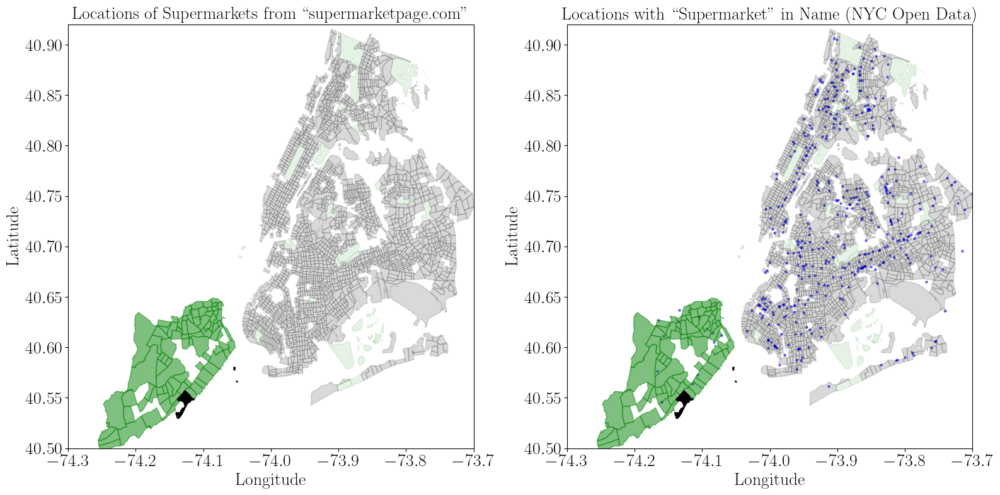

In [528]:
fig, ax= plt.subplots(nrows=1, ncols=2,figsize=(16,8))

#show areas
BOROUGHS_TO_CONSIDER=["Bronx", "Brooklyn", "Queens", "Manhattan"]
NEIGHBORHOODS=[[],[]]
neighborhood_name="X"
neighborhood_code="X"

#query Bing API for latitude and longitude of an address - test address provided
geocode_bing = geocoder.bing("350 St Ann's Ave, Bronx, NY", key=API_key)
long_lat_mont = [-73.89523018917087, 40.847372509635]    
testpoint = geometry.Point(long_lat_mont[0], long_lat_mont[1])

#testing for excluding Staten Island from analysis 
SI_NTACODES=[]
testpoint = geometry.Point(long_lat_mont[0], long_lat_mont[1])
#then, highlight all (sub)neighborhoods in that neighborhood
for i in range(0, len(GEO_AREAS)):
    MP = shapely.wkt.loads(GEO_AREAS[i])
    if(MP.contains(testpoint)):
            neighborhood_name=GEO_NTANAME[i]
            neighborhood_code=GEO_NTACODE[i]
            if(verbose):
                print(neighborhood_name, neighborhood_code)
            break
    for geom in MP.geoms:
        xs, ys = geom.exterior.xy
        #if(BORONAME[i]=='Bronx'):
        #if(True):
        if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
            if(GEO_NTACODE[i][-2:]=='99'):
                ax[0].fill(xs, ys, alpha=0.1, color='green')
                ax[1].fill(xs, ys, alpha=0.1, color='green')
            else:
                ax[0].fill(xs, ys, alpha=0.15, color='black')
                ax[1].fill(xs, ys, alpha=0.15, color='black')
            if(GEO_NTANAME[i] not in NEIGHBORHOODS[0]):
                NEIGHBORHOODS[0].append(GEO_NTANAME[i])
                NEIGHBORHOODS[1].append(GEO_NTACODE[i])
        else:
            SI_NTACODES.append(GEO_NTACODE[i])
            if(verbose):
                print(GEO_NTACODE[i], GEO_BORONAME[i], GEO_NTANAME[i], GEO_BOROCT2010[i])
            if(GEO_NTACODE[i][-2:]=='99'):
                ax[0].fill(xs, ys, alpha=1.0, color='black')
                ax[1].fill(xs, ys, alpha=1.0, color='black')
            else:
                ax[0].fill(xs, ys, alpha=0.5, color='green')
                ax[1].fill(xs, ys, alpha=0.5, color='green')

for i in range(0, len(SUPERMARKET_COORDS_web)):
    ax[0].scatter(SUPERMARKET_COORDS_web[i][0], SUPERMARKET_COORDS_web[i][1], color="red", marker='o', 
               alpha=0.5, s=5)
for i in range(0, len(SUPERMARKET_COORDS_NYCOD)):
    ax[1].scatter(SUPERMARKET_COORDS_NYCOD[i][0], SUPERMARKET_COORDS_NYCOD[i][1], color="blue", marker='o', 
               alpha=0.5, s=5)
#whole city
for i in range(0, 2):
    ax[i].set_xlim([-74.3, -73.7])
    ax[i].set_ylim([40.5, 40.92])
    #ax.set_xlim([np.minimum(testx1, testx2)*1.001, np.maximum(testx1, testx2)*0.999])
    #ax.set_ylim([np.minimum(testy1, testy2)*0.999, np.maximum(testy1, testy2)*1.001])
    ax[i].set_xlabel(r"$\text{Longitude}$", fontsize=universal_fontsize)
    ax[i].set_ylabel(r"$\text{Latitude}$", fontsize=universal_fontsize)
ax[0].set_title(r"$\text{Locations of Supermarkets from ``supermarketpage.com''}$", fontsize=universal_fontsize)
ax[1].set_title(r"$\text{Locations with ``Supermarket'' in Name (NYC Open Data)}$", fontsize=universal_fontsize)
#ax.set_title(r"$\text{Combined Supermarket Locations (no duplicates)}$", fontsize=universal_fontsize)
#ax.text(-73.1, 40.55, r"test", color="white")

### map locations from web and NYC OD combined (no duplicates)

Text(0.5, 1.0, '$\\text{Combined Supermarket Locations (no duplicates)}$')

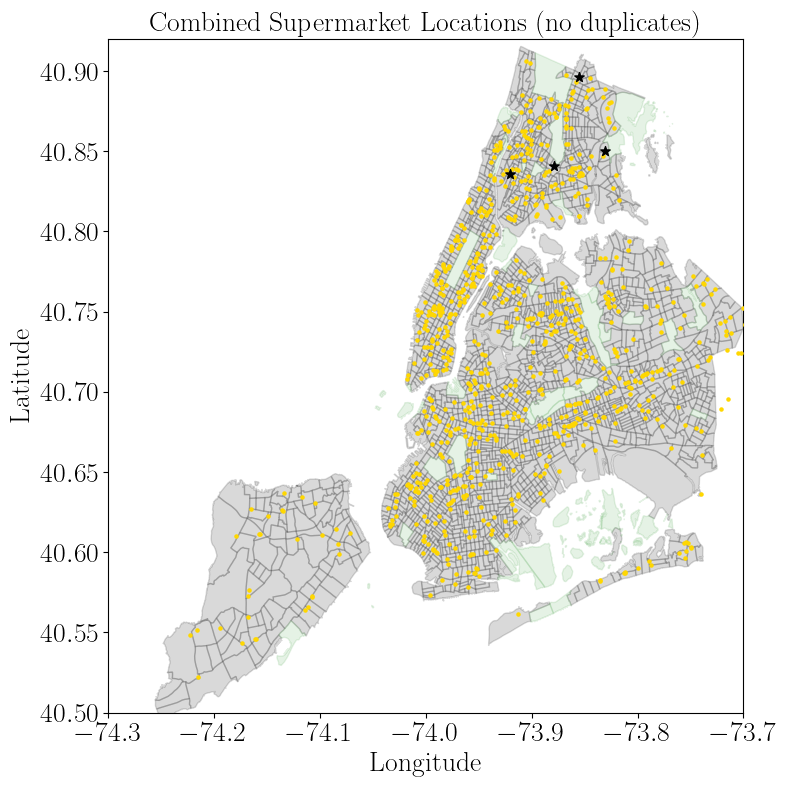

In [33]:
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(8,8))

#show areas
BOROUGHS_TO_CONSIDER=["Bronx", "Brooklyn", "Queens"]
NEIGHBORHOODS=[[],[]]
neighborhood_name="X"
neighborhood_code="X"

#then, highlight all (sub)neighborhoods in that neighborhood
for i in range(0, len(GEO_AREAS)):
    MP = shapely.wkt.loads(GEO_AREAS[i])
    for geom in MP.geoms:
        xs, ys = geom.exterior.xy
        if(True):
            if(GEO_NTACODE[i][-2:]=='99'):
                ax.fill(xs, ys, alpha=0.1, color='green')
            else:
                ax.fill(xs, ys, alpha=0.15, color='black')
            if(GEO_NTANAME[i] not in NEIGHBORHOODS[0]):
                NEIGHBORHOODS[0].append(GEO_NTANAME[i])
                NEIGHBORHOODS[1].append(GEO_NTACODE[i])
for i in range(0, len(SUPERMARKET_COORDS_COMBINED)):
    ax.scatter(SUPERMARKET_COORDS_COMBINED[i][0], SUPERMARKET_COORDS_COMBINED[i][1], color="gold", marker='o', 
               alpha=1.0, s=5, zorder=4)
#some locations of note -- supermarkets queried in CUNY data
ax.scatter(-73.83061124929013, 40.850308655856686, color="black", s=50, marker="*", zorder=5)
ax.scatter(-73.92051573149968, 40.835770236782295, color="black", s=50, marker="*", zorder=5)
ax.scatter(-73.87894643149946, 40.84074565468687, color="black", s=50, marker="*", zorder=5)
ax.scatter(-73.85541410266144, 40.89621276147498, color="black", s=50, marker="*", zorder=5)

ax.set_xlim([-74.3, -73.7])
ax.set_ylim([40.5, 40.92])
ax.set_xlabel(r"$\text{Longitude}$", fontsize=universal_fontsize)
ax.set_ylabel(r"$\text{Latitude}$", fontsize=universal_fontsize)
ax.set_title(r"$\text{Combined Supermarket Locations (no duplicates)}$", fontsize=universal_fontsize)

### show the discretized grid

/tmp/ipykernel_69294/401099371.py:16: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  valid_points.extend([j for j in points if geom.contains(j)])


Done


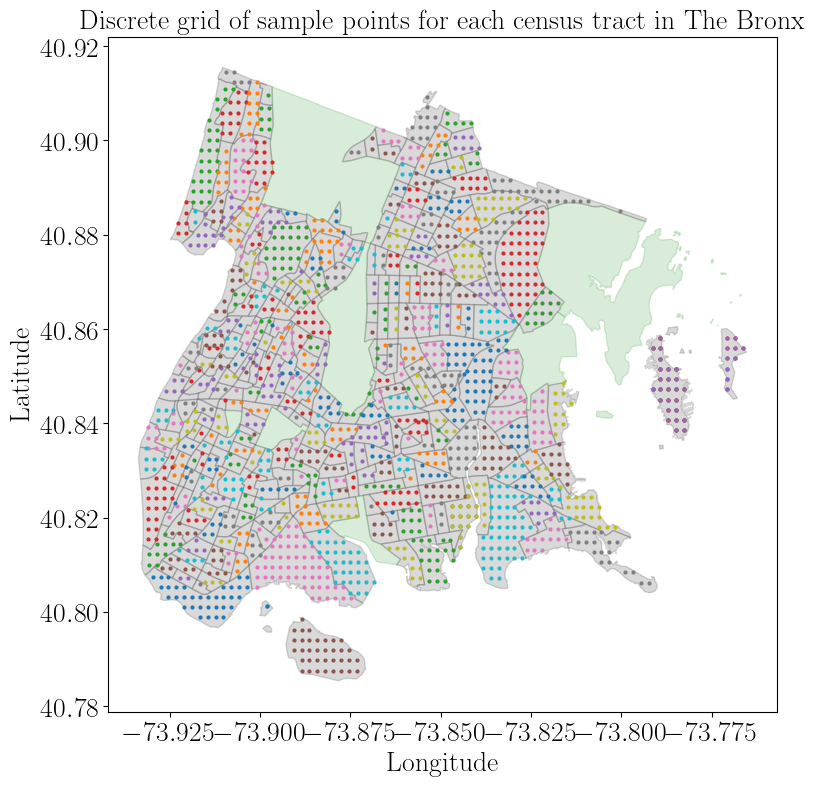

In [34]:
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(8,8))
#then, highlight all (sub)neighborhoods in that neighborhood
resolution=0.15/(conv_km_to_mi*conv_deg_to_km)
for i in range(0, len(GEO_AREAS)):
#for i in range(0, 10):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    if(GEO_BORONAME[i]=="Bronx"):
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(GEO_NTACODE[i][-2:]!='99'):
                ax.fill(xs, ys, alpha=0.15, color='black')
                lonmin, latmin, lonmax, latmax = geom.bounds
                xgrid, ygrid = np.meshgrid(np.arange(lonmin, lonmax, resolution), np.arange(latmin, latmax, resolution))
                points = MultiPoint(list(zip(xgrid.flatten(),ygrid.flatten())))
                valid_points.extend([j for j in points if geom.contains(j)])
                xps = [point.x for point in valid_points]
                yps = [point.y for point in valid_points]
                ax.scatter(xps, yps, s=4, zorder=4)
            #valid_points.extend(filter(geom.contains, points))
            #print(latmin, np.min(ys))
            #geom.bounds#longmin
            #print(valid_points)#, points, xgrid, ygrid)
            else:
                ax.fill(xs, ys, alpha=0.15, color='green')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)

ax.set_title("Discrete grid of sample points for each census tract in The Bronx", fontsize=universal_fontsize)
ax.set_xlabel("Longitude", fontsize=universal_fontsize)
ax.set_ylabel("Latitude", fontsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
print("Done")


### show car availability and population

In [35]:
car_access_dataframe=pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/Percent_Households_One_Vehicle_Available.csv')
population_dataframe=pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/Population_by_CT.csv')
percap_inc_dataframe=pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/Per_Capita_Income_CT.csv')
#print(percap_inc_dataframe)

In [36]:
CARACCESS_NAME=np.asarray(car_access_dataframe['Name'])
CARACCESS_VEHICLES=np.asarray(car_access_dataframe['% Vehicles Available | 1 vehicle available, 2023 [Estimated]'])
POPULATION_BY_CT=np.asarray(population_dataframe['# Total Population, 2023 [Estimated]'])
PERCAP_INC_BY_CT=np.asarray(percap_inc_dataframe['Per Capita Income, 2023 [Estimated]'])
CARACCESS_CT=[]
BORO_NAMES_AND_CODES = {
    "New York": 1,
    "Bronx": 2,
    "Kings": 3,
    "Queens": 4,
    "Richmond": 5
}
for i in range(0, len(CARACCESS_NAME)):
    ca_ct=CARACCESS_NAME[i].split(',')[0][2:]
    #full_census_tract=ca_ct
    ca_boroname = CARACCESS_NAME[i].split(',')[1][1:-7]
    ca_borocode = BORO_NAMES_AND_CODES[ca_boroname]
    full_census_tract = int("%d%s"%(ca_borocode, ca_ct))
    neighborhood_indices = np.where(GEO_BOROCT2010 == full_census_tract)[0]
    
    CARACCESS_CT.append(full_census_tract)
    
    #print(CARACCESS_NAME[i], GEO_NTANAME[neighborhood_indices], GEO_BOROCT2010[neighborhood_indices], "---", full_census_tract, CARACCESS_VEHICLES[i])
    #print(ca_boroname, ca_ct, full_census_tract)
CARACCESS_CT=np.array(CARACCESS_CT)
print("Done", len(CARACCESS_CT), len(CARACCESS_VEHICLES),np.min(PERCAP_INC_BY_CT), np.max(PERCAP_INC_BY_CT))
#for i in range(0, len(GEO_BOROCT2010)):
#    print(GEO_BOROCT2010[i])
#    if(GEO_CT2010[i]==400):
#        print(GEO_NTANAME[i])
#print(GEO_CT2010, CARACCESS_CT, GEO_BOROCT2010)

Done 2327 2327 nan nan


Done


/home/pedro/.local/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


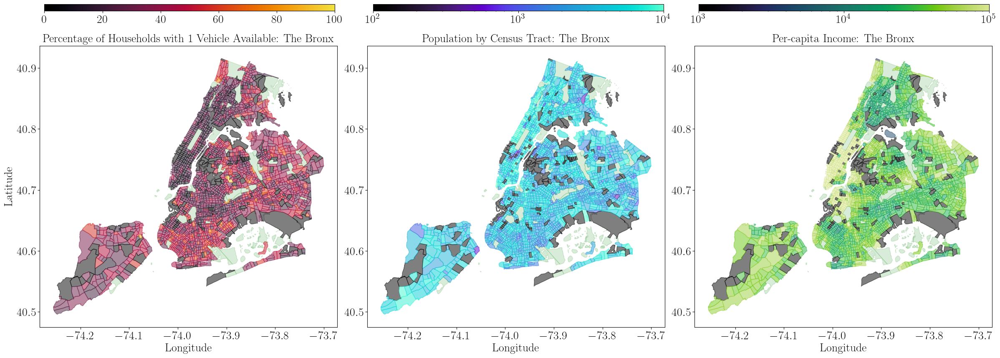

In [37]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=3,figsize=(24,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')
cmap1 = matplotlib.cm.get_cmap('cmr.ember')
cmap2 = matplotlib.cm.get_cmap('cmr.cosmic')
cmap3 = matplotlib.cm.get_cmap('cmr.toxic')

normalize1 = plt.Normalize(vmin=0.0, vmax=100)
normalize2 = matplotlib.colors.LogNorm(vmin=1e2, vmax=1e4)
normalize3 = matplotlib.colors.LogNorm(vmin=1e3, vmax=1e5)
#normalize2 = plt.Normalize(vmin=0.0, vmax=2e4)
#then, highlight all (sub)neighborhoods in that neighborhood
for i in range(0, len(GEO_AREAS)):
#for i in range(0, 10):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    #if(GEO_BORONAME[i]=="Bronx"):
    if(True):
        boro_census_tract=GEO_BOROCT2010[i]
        ca_matching_index = np.where(CARACCESS_CT==boro_census_tract)
        try:
            percentage_of_vehicles_in_ct=CARACCESS_VEHICLES[ca_matching_index][0]
        except:
            percentage_of_vehicles_in_ct=0.0
        try:
            population_in_ct=POPULATION_BY_CT[ca_matching_index][0]
        except:
            population_in_ct=0.0
        try:
            percap_inc_in_ct=PERCAP_INC_BY_CT[ca_matching_index][0]
        except:
            percap_inc_in_ct=0.0
        #print(percentage_of_vehicles_in_ct, boro_census_tract)
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(GEO_NTACODE[i][-2:]!='99'):
                ax[0].fill(xs, ys, alpha=0.5, color=cmap1(normalize1(percentage_of_vehicles_in_ct)))
                ax[1].fill(xs, ys, alpha=0.5, color=cmap2(normalize2(population_in_ct)))
                ax[2].fill(xs, ys, alpha=0.5, color=cmap3(normalize3(percap_inc_in_ct)))
            #valid_points.extend(filter(geom.contains, points))
            #print(latmin, np.min(ys))
            #geom.bounds#longmin
            #print(valid_points)#, points, xgrid, ygrid)
            else:
                ax[0].fill(xs, ys, alpha=0.15, color='green')
                ax[1].fill(xs, ys, alpha=0.15, color='green')
                ax[2].fill(xs, ys, alpha=0.15, color='green')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)

ax[0].set_title("Percentage of Households with 1 Vehicle Available: The Bronx", fontsize=universal_fontsize)
ax[1].set_title("Population by Census Tract: The Bronx", fontsize=universal_fontsize)
ax[2].set_title("Per-capita Income: The Bronx", fontsize=universal_fontsize)
ax[0].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[1].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[2].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[0].set_ylabel("Latitude", fontsize=universal_fontsize)
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
cb_ax1 = fig.add_axes([0.047, 1.05, 0.29, 0.02])
cb1 = cbar.ColorbarBase(cb_ax1, cmap=cmap1,norm=plt.Normalize(0, 100),orientation='horizontal')

cb_ax2 = fig.add_axes([0.375, 1.05, 0.29, 0.02])
#formatter = LogFormatter(10, labelOnlyBase=False) 
cb2 = cbar.ColorbarBase(cb_ax2, cmap=cmap2,norm=matplotlib.colors.LogNorm(vmin=1e2, vmax=1e4), orientation='horizontal')

cb_ax3 = fig.add_axes([0.7, 1.05, 0.29, 0.02])
cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap3,norm=matplotlib.colors.LogNorm(vmin=1e3, vmax=1e5),orientation='horizontal')
#cbar=plt.colorbar(histoplot, cax=cb_ax, orientation='vertical')#, ticks=[1e11, 1e12, 1e13, 1e14, 1e15, 1e16])
#cbar.set_label(label=cblab, size=universal_fontsize)
#    cbar.ax.tick_params(labelsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
print("Done")

### calculate and show food accessibility index

/tmp/ipykernel_69294/4053104833.py:42: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  valid_points.extend([j for j in points if geom.contains(j)])
/tmp/ipykernel_69294/4053104833.py:56: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  supermarket_enumerator_walking.extend([j for j in supermarket_points if localbuffer_walking.contains(j)])
/tmp/ipykernel_69294/4053104833.py:57: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  supermarket_enumerator_driving.extend([k for k in supermarket_points if localbuffer_driving.contains(k)])
/tmp/ipykerne

Done
0:20:49.654978


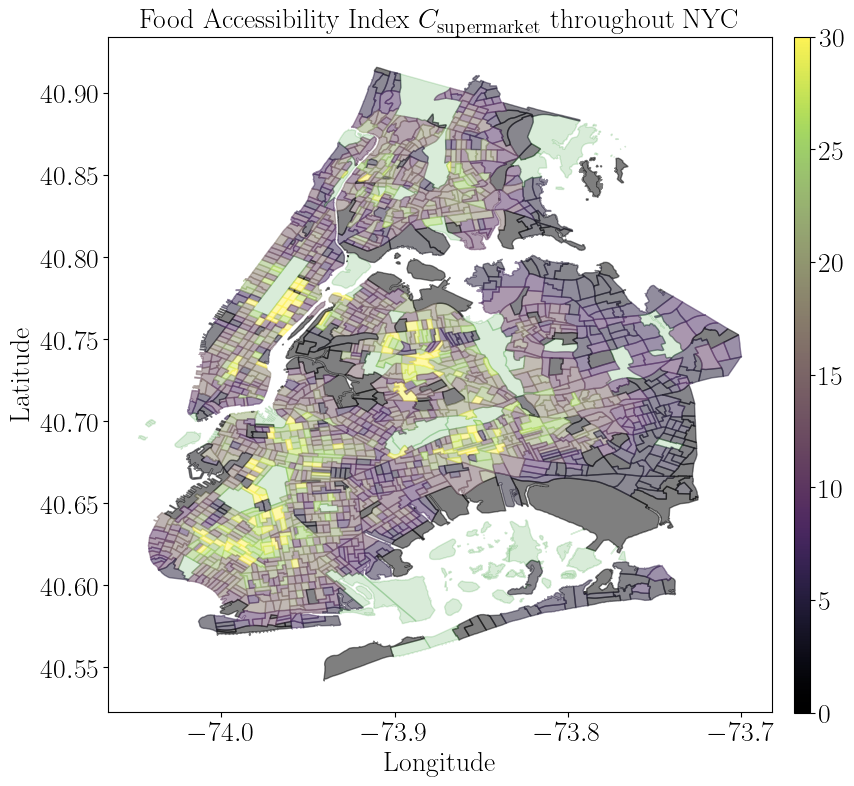

In [38]:
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(8,8))
cmap = matplotlib.cm.get_cmap('cmr.ghostlight')

startTime = datetime.now()

#then, highlight all (sub)neighborhoods in that neighborhood
resolution=0.15/(conv_km_to_mi*conv_deg_to_km)
walking_distance=0.5/(conv_km_to_mi*conv_deg_to_km)
driving_distance=2.0/(conv_km_to_mi*conv_deg_to_km)
#make a list of points corresponding to  supermarket_coords
supermarket_points = MultiPoint(SUPERMARKET_COORDS_COMBINED)
bodega_points = MultiPoint(BODEGA_COORDS_NYCOD)
BOROUGHS_TO_CONSIDER=["Bronx", "Brooklyn", "Queens", "Manhattan"]
#BOROUGHS_TO_CONSIDER=["Bronx", "Manhattan"]
minsupes=0.0
maxsupes=30.0
normalize = plt.Normalize(vmin=minsupes, vmax=maxsupes)
FOOD_ACCESSIBILITY_INDEX_NUM=[]
FOOD_ACCESSIBILITY_INDEX_DEN=[]
for i in range(0, len(GEO_AREAS)):
#for i in range(231, 232):
    valid_points=[]
    supermarket_enumerator_walking=[]
    supermarket_enumerator_driving=[]
    bodega_enumerator_walking=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    #if(True):
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
        #print(i)
        boro_census_tract=GEO_BOROCT2010[i]
        ca_matching_index = np.where(CARACCESS_CT==boro_census_tract)
        try:
            fraction_of_vehicles_in_ct=CARACCESS_VEHICLES[ca_matching_index][0]/100.0
        except:
            fraction_of_vehicles_in_ct=0.0
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(GEO_NTACODE[i][-2:]!='99'):
                lonmin, latmin, lonmax, latmax = geom.bounds
                xgrid, ygrid = np.meshgrid(np.arange(lonmin, lonmax, resolution), np.arange(latmin, latmax, resolution))
                points = MultiPoint(list(zip(xgrid.flatten(),ygrid.flatten())))
                valid_points.extend([j for j in points if geom.contains(j)])
                xps = [point.x for point in valid_points]
                yps = [point.y for point in valid_points]
                #ax.scatter(xps, yps, s=4, zorder=4)
                for a in range(0, len(valid_points)):
                    local_xcoord=xps[a]
                    local_ycoord=yps[a]
                    localbuffer_walking = Point(local_xcoord,local_ycoord).buffer(walking_distance)
                    localbuffer_driving = Point(local_xcoord,local_ycoord).buffer(driving_distance)
                    
                    locbuffxs_walking,locbuffys_walking = localbuffer_walking.exterior.xy
                    locbuffxs_driving,locbuffys_driving = localbuffer_driving.exterior.xy
                    #ax.fill(locbuffxs_walking, locbuffys_walking, alpha=0.15, color='blue')
                    #ax.fill(locbuffxs_driving, locbuffys_driving, alpha=0.15, color='green')
                    supermarket_enumerator_walking.extend([j for j in supermarket_points if localbuffer_walking.contains(j)])
                    supermarket_enumerator_driving.extend([k for k in supermarket_points if localbuffer_driving.contains(k)])
                    bodega_enumerator_walking.extend([l for l in bodega_points if localbuffer_walking.contains(l)])
                #print(supermarket_enumerator.x)
                try:
                    avg_walking_distance_supermarkets = len(supermarket_enumerator_walking)/len(valid_points)
                except:
                    avg_walking_distance_supermarkets = 0.0
                try:
                    avg_driving_distance_supermarkets = len(supermarket_enumerator_driving)/len(valid_points)
                except:
                    avg_driving_distance_supermarkets = 0.0
                try:
                    avg_walking_distance_bodegas = len(bodega_enumerator_walking)/len(valid_points)
                except:
                    avg_walking_distance_bodegas = 1.0
                
                food_access_ind_numerator = avg_walking_distance_supermarkets + avg_driving_distance_supermarkets*fraction_of_vehicles_in_ct
                food_access_ind_denomenator = np.maximum(1.0, avg_walking_distance_bodegas)
                #food_access_ind = food_access_ind_numerator#/food_access_ind_denomenator
                FOOD_ACCESSIBILITY_INDEX_NUM.append(food_access_ind_numerator)
                FOOD_ACCESSIBILITY_INDEX_DEN.append(food_access_ind_denomenator)
                #ax.fill(xs, ys, alpha=0.5, color=cmap(normalize(avg_walking_distance_supermarkets)))
                ax.fill(xs, ys, alpha=0.5, color=cmap(normalize(food_access_ind_numerator)))
                #ax.fill(xs, ys, alpha=0.5, color="red")
                #CS = ax.contourf(xs, ys, z, cmap=cmap)
            #valid_points.extend(filter(geom.contains, points))
            #print(latmin, np.min(ys))
            #geom.bounds#longmin
            #print(valid_points)#, points, xgrid, ygrid)
            else:
                ax.fill(xs, ys, alpha=0.15, color='green')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)
            
#xpstemp = [point.x for point in supermarket_points]
#ypstemp = [point.y for point in supermarket_points]
#ax.scatter(xpstemp, ypstemp, s=20, zorder=4, color='black', marker="*")

#print(len(supermarket_enumerator_walking)/len(valid_points), len(supermarket_enumerator_driving)/len(valid_points))
#print(np.min(FOOD_ACCESSIBILITY_INDEX), np.max(FOOD_ACCESSIBILITY_INDEX))
#x_norm = (x-np.min(x))/(np.max(x)-np.min(x))
#collection = PatchCollection(patches)

ax.set_title(r"$\text{Food Accessibility Index } C_{\rm supermarket} \text{ throughout NYC}$", fontsize=universal_fontsize)
ax.set_xlabel("Longitude", fontsize=universal_fontsize)
ax.set_ylabel("Latitude", fontsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
#ax.set_xlim(-74.0, -73.85)
#ax.set_ylim(40.73, 40.87)

#ax.colorbar(CS)
#cbax = fig.colorbar(CS)
cb_ax = fig.add_axes([1.0, 0.1, 0.02, 0.845])
cb2 = cbar.ColorbarBase(cb_ax, cmap=cmap,norm=plt.Normalize(minsupes, maxsupes))
#plt.plot(x,2+plt.sin(y), "--k")
#ax.set_xlim([-74.3, -73.7])
#ax.set_ylim([40.5, 40.92])
print("Done")
print((datetime.now() - startTime))

/tmp/ipykernel_69294/2960656111.py:50: RuntimeWarning: divide by zero encountered in double_scalars
  food_desert_index = population_in_ct/food_access_ind_numerator
/tmp/ipykernel_69294/2960656111.py:51: RuntimeWarning: divide by zero encountered in double_scalars
  food_swamp_index = food_access_ind_denomenator/food_access_ind_numerator


Done
0:00:10.180431


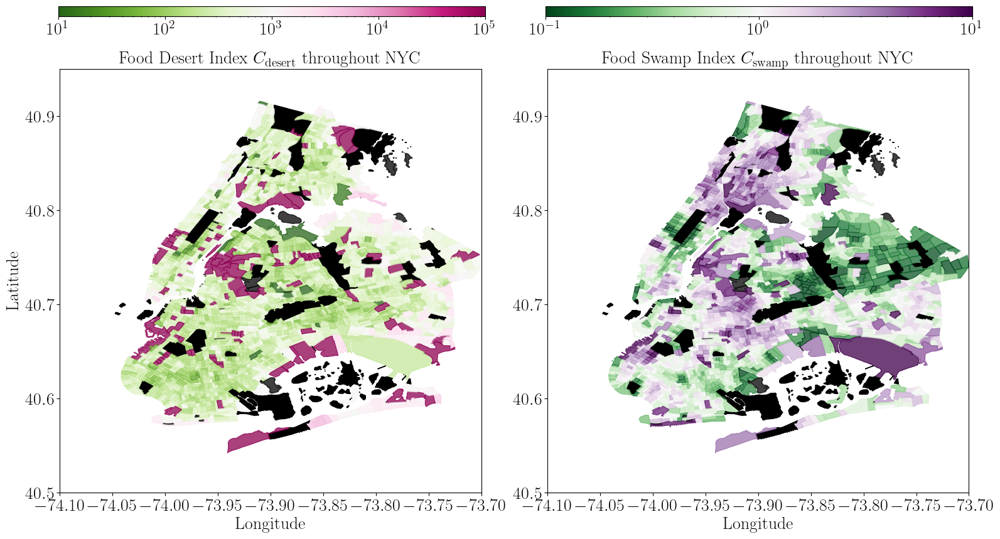

In [44]:
fig, ax= plt.subplots(nrows=1, ncols=2,figsize=(16,8))
#cmap = matplotlib.cm.get_cmap('cmr.ghostlight')
#cmap = matplotlib.cm.get_cmap('cmr.prinsenvlag')
#cmap = matplotlib.cm.get_cmap('cmr.fusion')
cmap1 = matplotlib.cm.get_cmap('PiYG_r')
cmap2 = matplotlib.cm.get_cmap('PRGn_r')

startTime = datetime.now()

#then, highlight all (sub)neighborhoods in that neighborhood
#make a list of points corresponding to  supermarket_coords
#minsupes=1e-1
#maxsupes=1e1
minsupes=[1e1, 1e-1]
maxsupes=[1e5, 1e1]
#normalize = plt.Normalize(vmin=minsupes, vmax=maxsupes)
normalize1 = matplotlib.colors.LogNorm(vmin=minsupes[0], vmax=maxsupes[0])
normalize2 = matplotlib.colors.LogNorm(vmin=minsupes[1], vmax=maxsupes[1])
#BOROUGHS_TO_CONSIDER=["Bronx", "Brooklyn", "Queens", "Manhattan"]
#BOROUGHS_TO_CONSIDER=["Bronx", "Manhattan"]
#norm_relative_to = np.asarray(FOOD_ACCESSIBILITY_INDEX_NUM)/np.asarray(FOOD_ACCESSIBILITY_INDEX_DEN)
FOOD_ACCESSIBILITY_INDEX=np.asarray(FOOD_ACCESSIBILITY_INDEX_NUM)/np.asarray(FOOD_ACCESSIBILITY_INDEX_DEN)
FOOD_DESERT_INDEX=[]
FOOD_SWAMP_INDEX=[]
dummy=0
for i in range(0, len(GEO_AREAS)):
#for i in range(231, 232):
    MP = shapely.wkt.loads(GEO_AREAS[i])
    #if(True):
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
        boro_census_tract=GEO_BOROCT2010[i]
        ca_matching_index = np.where(CARACCESS_CT==boro_census_tract)
        try:
            population_in_ct = POPULATION_BY_CT[ca_matching_index][0]
        except:
            population_in_ct = 1e10
        population_in_ct = np.maximum(1.0,population_in_ct)
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(GEO_NTACODE[i][-2:]!='99'):
                food_access_ind_numerator = FOOD_ACCESSIBILITY_INDEX_NUM[dummy]
                food_access_ind_denomenator = FOOD_ACCESSIBILITY_INDEX_DEN[dummy]
                food_access_ind = FOOD_ACCESSIBILITY_INDEX[dummy]
                
                #food_access_ind_norm = (food_access_ind-np.min(FOOD_ACCESSIBILITY_INDEX))/(np.max(FOOD_ACCESSIBILITY_INDEX)-np.min(FOOD_ACCESSIBILITY_INDEX))
                #food_access_ind_norm = (food_access_ind)/(41.194881333333335)
                food_access_ind_norm = (food_access_ind)/(1.0)
                #food_access_ind_norm = (food_access_ind-np.min(norm_relative_to))/(np.max(norm_relative_to)-np.min(norm_relative_to))
                #I originally defined these to be the inverse of what's being calculated here, so be careful
                food_desert_index = population_in_ct/food_access_ind_numerator
                food_swamp_index = food_access_ind_denomenator/food_access_ind_numerator
                
                FOOD_DESERT_INDEX.append(food_desert_index)
                FOOD_SWAMP_INDEX.append(food_swamp_index)
                ax[0].fill(xs, ys, alpha=0.75, color=cmap1(normalize1(food_desert_index)))
                #ax.fill(xs, ys, alpha=0.75, color=cmap(normalize(food_access_ind_numerator/food_access_ind_denomenator)))
                ax[1].fill(xs, ys, alpha=0.75, color=cmap2(normalize2(food_swamp_index)))
                #print(population_in_ct, food_access_ind_numerator, food_access_ind_numerator/population_in_ct)
                dummy += 1
            else:
                ax[0].fill(xs, ys, alpha=1.0, color='black')
                ax[1].fill(xs, ys, alpha=1.0, color='black')
#print(len(supermarket_enumerator_walking)/len(valid_points), len(supermarket_enumerator_driving)/len(valid_points))
#FAI_NORMALIZED = (FOOD_ACCESSIBILITY_INDEX-np.min(FOOD_ACCESSIBILITY_INDEX))/(np.max(FOOD_ACCESSIBILITY_INDEX)-np.min(FOOD_ACCESSIBILITY_INDEX))
#collection = PatchCollection(patches)

ax[0].set_title(r"$\text{Food Desert Index } C_{\rm desert} \text{ throughout NYC}$", fontsize=universal_fontsize)
ax[1].set_title(r"$\text{Food Swamp Index } C_{\rm swamp} \text{ throughout NYC}$", fontsize=universal_fontsize)
ax[0].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[1].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[0].set_ylabel("Latitude", fontsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
#ax.set_xlim(-74.0, -73.85)
#ax.set_ylim(40.73, 40.87)

#ax.colorbar(CS)
#cbax = fig.colorbar(CS)
cb_ax1 = fig.add_axes([0.062, 1.05, 0.425, 0.02])
#formatter = LogFormatter(10, labelOnlyBase=False) 
cb1 = cbar.ColorbarBase(cb_ax1, cmap=cmap1,norm=matplotlib.colors.LogNorm(vmin=minsupes[0], vmax=maxsupes[0]), orientation='horizontal')

cb_ax2 = fig.add_axes([0.547, 1.05, 0.425, 0.02])
cb2 = cbar.ColorbarBase(cb_ax2, cmap=cmap2,norm=matplotlib.colors.LogNorm(vmin=minsupes[1], vmax=maxsupes[1]),orientation='horizontal')
#plt.plot(x,2+plt.sin(y), "--k")
for aind in range(0, 2):
    ax[aind].set_xlim([-74.1, -73.7])
    ax[aind].set_ylim([40.5, 40.95])
print("Done")
print((datetime.now() - startTime))

# Food affordability

Done


/home/pedro/.local/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


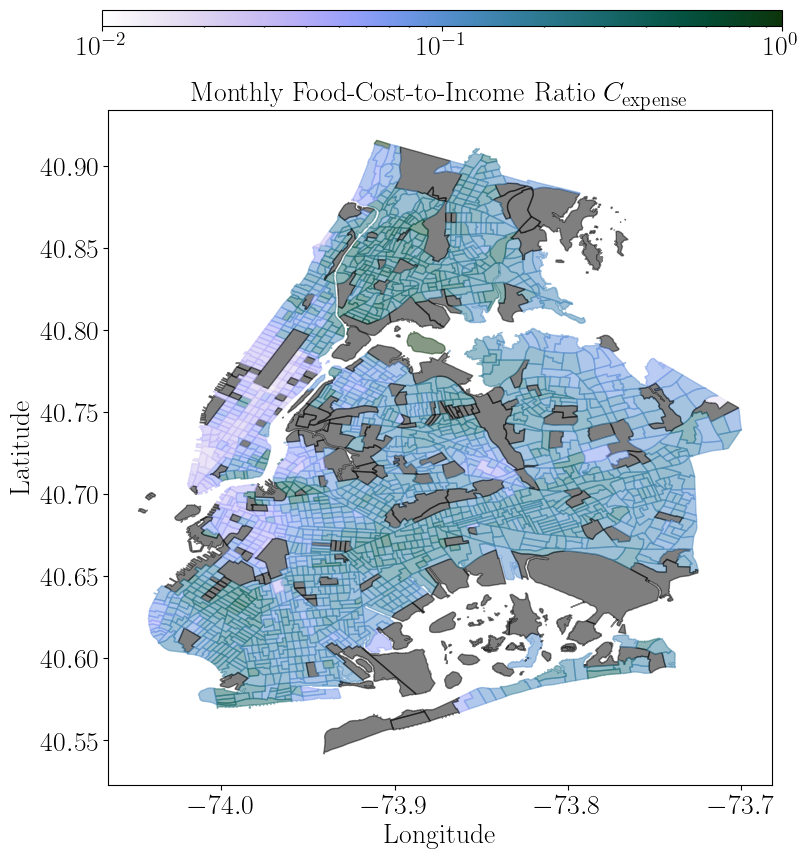

In [465]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(8,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')
cmap1 = matplotlib.cm.get_cmap('cmr.ember')
cmap2 = matplotlib.cm.get_cmap('cmr.cosmic')
#cmap3 = matplotlib.cm.get_cmap('cmr.toxic')
cmap3 = matplotlib.cm.get_cmap('cmr.horizon_r')

AVG_WEEKLY_COST_PER_PERSON=100.0
AVG_NO_PEOPLE_PER_HOUSEHOLD=2.56
AVG_MONTHLY_COST_PER_HOUSEHOLD=AVG_WEEKLY_COST_PER_PERSON*4.0*AVG_NO_PEOPLE_PER_HOUSEHOLD
AVG_MONTHLY_COST_PER_PERSON=AVG_WEEKLY_COST_PER_PERSON*4.0

normalize3 = matplotlib.colors.LogNorm(vmin=1e-2, vmax=1e0)

FOOD_AFFORDABILITY_INDEX=[]
PER_CAPITA_INCOME=[]
CTS_CONSIDERED=[]
#normalize2 = plt.Normalize(vmin=0.0, vmax=2e4)
#then, highlight all (sub)neighborhoods in that neighborhood
for i in range(0, len(GEO_AREAS)):
#for i in range(0, 10):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
    #if(True):
        boro_census_tract=GEO_BOROCT2010[i]
        ca_matching_index = np.where(CARACCESS_CT==boro_census_tract)
        try:
            percap_inc_in_ct=PERCAP_INC_BY_CT[ca_matching_index][0]
            percap_monthly_inc_in_ct=PERCAP_INC_BY_CT[ca_matching_index][0]/12.0
            percap_inc_to_cost_ratio = percap_monthly_inc_in_ct/AVG_MONTHLY_COST_PER_PERSON
        except:
            percap_inc_in_ct=0.0
            percap_monthly_inc_in_ct=0.0
            percap_inc_to_cost_ratio = np.nan
        #print(percentage_of_vehicles_in_ct, boro_census_tract)
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(GEO_NTACODE[i][-2:]!='99'):
                #ax.fill(xs, ys, alpha=0.5, color=cmap3(normalize3(percap_monthly_inc_in_ct)))
                ax.fill(xs, ys, alpha=0.5, color=cmap3(normalize3(1./percap_inc_to_cost_ratio)))
                FOOD_AFFORDABILITY_INDEX.append(1./percap_inc_to_cost_ratio)
                PER_CAPITA_INCOME.append(percap_monthly_inc_in_ct)
                CTS_CONSIDERED.append(boro_census_tract)
            #valid_points.extend(filter(geom.contains, points))
            #print(latmin, np.min(ys))
            #geom.bounds#longmin
            #print(valid_points)#, points, xgrid, ygrid)
            else:
                ax.fill(xs, ys, alpha=0.5, color='black')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)

ax.set_title(r"$\text{Monthly Food-Cost-to-Income Ratio } C_{\rm expense}$", fontsize=universal_fontsize)
ax.set_xlabel("Longitude", fontsize=universal_fontsize)
ax.set_ylabel("Latitude", fontsize=universal_fontsize)
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
cb_ax3 = fig.add_axes([0.135, 1.05, 0.85, 0.02])
cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap3,norm=matplotlib.colors.LogNorm(vmin=1e-2, vmax=1e0),orientation='horizontal')
#cbar=plt.colorbar(histoplot, cax=cb_ax, orientation='vertical')#, ticks=[1e11, 1e12, 1e13, 1e14, 1e15, 1e16])
#cbar.set_label(label=cblab, size=universal_fontsize)
#    cbar.ax.tick_params(labelsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
print("Done")

2073 2073 2073
Done


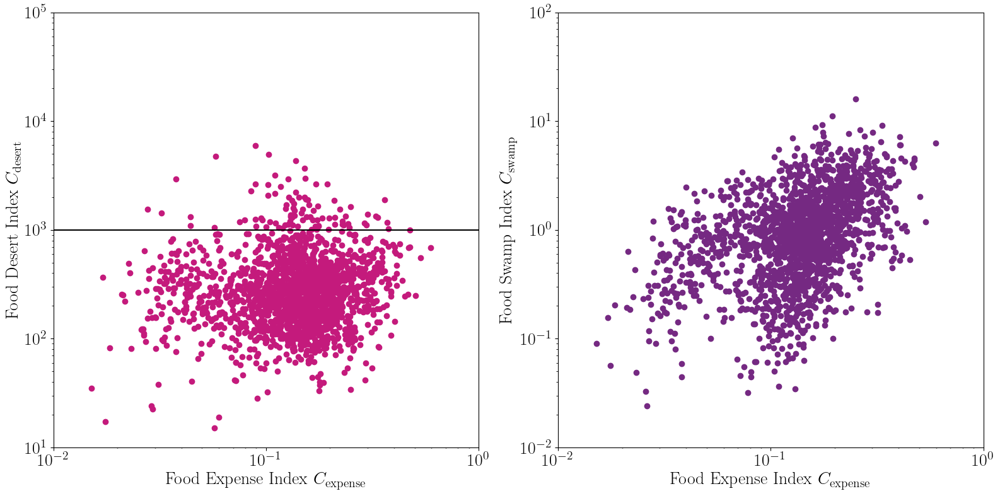

In [51]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=2,figsize=(16,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')

cmap1 = matplotlib.cm.get_cmap('PiYG')
cmap2 = matplotlib.cm.get_cmap('PRGn')

print(len(FOOD_DESERT_INDEX), len(FOOD_SWAMP_INDEX), len(FOOD_AFFORDABILITY_INDEX))

ax[0].scatter(FOOD_AFFORDABILITY_INDEX, np.asarray(FOOD_DESERT_INDEX), color=cmap1(0.1))
ax[1].scatter(FOOD_AFFORDABILITY_INDEX, np.asarray(FOOD_SWAMP_INDEX), color=cmap2(0.1))

#ax.set_title(r"$\text{Monthly Income-to-Food-Cost Ratio } C_{\rm afford}$", fontsize=universal_fontsize)
ax[0].set_xlabel(r"$\text{Food Expense Index } C_{\rm expense}$", fontsize=universal_fontsize)
ax[1].set_xlabel(r"$\text{Food Expense Index } C_{\rm expense}$", fontsize=universal_fontsize)
ax[0].set_ylabel(r"$\text{Food Desert Index } C_{\rm desert}$", fontsize=universal_fontsize)
ax[1].set_ylabel(r"$\text{Food Swamp Index } C_{\rm swamp}$", fontsize=universal_fontsize)

ax[0].set_yscale('log')
ax[0].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xscale('log')

ax[0].set_xlim([1e-2,1e0])
ax[0].set_ylim([1e1,1e5])
ax[1].set_xlim([1e-2,1e0])
ax[1].set_ylim([1e-2,1e2])

ax[0].axhline(1e3, color="black")
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
#cb_ax3 = fig.add_axes([0.135, 1.05, 0.85, 0.02])
#cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap3,norm=matplotlib.colors.LogNorm(vmin=1e0, vmax=1e2),orientation='horizontal')
#cbar=plt.colorbar(histoplot, cax=cb_ax, orientation='vertical')#, ticks=[1e11, 1e12, 1e13, 1e14, 1e15, 1e16])
#cbar.set_label(label=cblab, size=universal_fontsize)
#    cbar.ax.tick_params(labelsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
print("Done")

### normalize quantities and add them up

0.0166114021336037 1.4164952443166097
Done


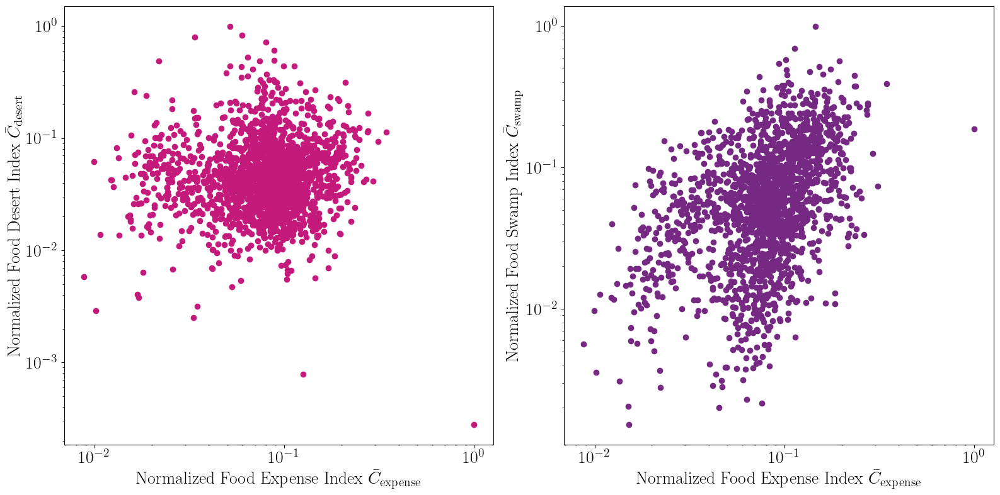

In [52]:
aFOOD_DESERT_INDEX = np.ma.masked_invalid(FOOD_DESERT_INDEX)
aFOOD_SWAMP_INDEX = np.ma.masked_invalid(FOOD_SWAMP_INDEX)
aFOOD_AFFORDABILITY_INDEX = np.ma.masked_invalid(FOOD_AFFORDABILITY_INDEX)

bFOOD_DESERT_INDEX = np.ma.masked_array(aFOOD_DESERT_INDEX, aFOOD_SWAMP_INDEX.mask)
cFOOD_DESERT_INDEX = np.ma.masked_array(bFOOD_DESERT_INDEX, aFOOD_AFFORDABILITY_INDEX.mask)

bFOOD_SWAMP_INDEX = np.ma.masked_array(aFOOD_SWAMP_INDEX, aFOOD_DESERT_INDEX.mask)
cFOOD_SWAMP_INDEX = np.ma.masked_array(bFOOD_SWAMP_INDEX, aFOOD_AFFORDABILITY_INDEX.mask)

bFOOD_AFFORDABILITY_INDEX = np.ma.masked_array(aFOOD_AFFORDABILITY_INDEX, aFOOD_DESERT_INDEX.mask)
cFOOD_AFFORDABILITY_INDEX = np.ma.masked_array(bFOOD_AFFORDABILITY_INDEX, aFOOD_SWAMP_INDEX.mask)

#print(np.min(cFOOD_DESERT_INDEX), np.max(cFOOD_DESERT_INDEX))
#print(np.min(cFOOD_SWAMP_INDEX), np.max(cFOOD_SWAMP_INDEX))
#print(np.min(cFOOD_AFFORDABILITY_INDEX), np.max(cFOOD_AFFORDABILITY_INDEX))

maxind_afford = np.argmax(cFOOD_AFFORDABILITY_INDEX)
#print(cFOOD_AFFORDABILITY_INDEX[maxind_afford], cFOOD_DESERT_INDEX[maxind_afford], cFOOD_SWAMP_INDEX[maxind_afford])
#FOOD_DESERT_INDEX_NORM = (cFOOD_DESERT_INDEX - np.min(cFOOD_DESERT_INDEX))/(np.max(cFOOD_DESERT_INDEX) - np.min(cFOOD_DESERT_INDEX))
#FOOD_SWAMP_INDEX_NORM = (np.asarray(cFOOD_SWAMP_INDEX) - np.min(cFOOD_SWAMP_INDEX))/(np.max(cFOOD_SWAMP_INDEX) - np.min(cFOOD_SWAMP_INDEX))
#FOOD_AFFORDABILITY_INDEX_NORM = (cFOOD_AFFORDABILITY_INDEX - np.min(cFOOD_AFFORDABILITY_INDEX))/(np.max(cFOOD_AFFORDABILITY_INDEX) - np.min(cFOOD_AFFORDABILITY_INDEX))

FOOD_DESERT_INDEX_NORM = (cFOOD_DESERT_INDEX)/(np.max(cFOOD_DESERT_INDEX))
FOOD_SWAMP_INDEX_NORM = (cFOOD_SWAMP_INDEX)/(np.max(cFOOD_SWAMP_INDEX))
FOOD_AFFORDABILITY_INDEX_NORM = (cFOOD_AFFORDABILITY_INDEX)/(np.max(cFOOD_AFFORDABILITY_INDEX))

FOOD_INSECURITY_INDEX = FOOD_DESERT_INDEX_NORM + FOOD_SWAMP_INDEX_NORM + FOOD_AFFORDABILITY_INDEX_NORM
print(np.min(FOOD_DESERT_INDEX_NORM + FOOD_SWAMP_INDEX_NORM + FOOD_AFFORDABILITY_INDEX_NORM), np.max(FOOD_DESERT_INDEX_NORM + FOOD_SWAMP_INDEX_NORM + FOOD_AFFORDABILITY_INDEX_NORM))
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=2,figsize=(16,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')

cmap1 = matplotlib.cm.get_cmap('PiYG')
cmap2 = matplotlib.cm.get_cmap('PRGn')

#print(len(FOOD_DESERT_INDEX), len(FOOD_SWAMP_INDEX), len(FOOD_AFFORDABILITY_INDEX))

ax[0].scatter(FOOD_AFFORDABILITY_INDEX_NORM, np.asarray(FOOD_DESERT_INDEX_NORM), color=cmap1(0.1))
ax[1].scatter(FOOD_AFFORDABILITY_INDEX_NORM, np.asarray(FOOD_SWAMP_INDEX_NORM), color=cmap2(0.1))

#ax.set_title(r"$\text{Monthly Income-to-Food-Cost Ratio } C_{\rm afford}$", fontsize=universal_fontsize)
ax[0].set_xlabel(r"$\text{Normalized Food Expense Index } \bar{C}_{\rm expense}$", fontsize=universal_fontsize)
ax[1].set_xlabel(r"$\text{Normalized Food Expense Index } \bar{C}_{\rm expense}$", fontsize=universal_fontsize)
ax[0].set_ylabel(r"$\text{Normalized Food Desert Index } \bar{C}_{\rm desert}$", fontsize=universal_fontsize)
ax[1].set_ylabel(r"$\text{Normalized Food Swamp Index } \bar{C}_{\rm swamp}$", fontsize=universal_fontsize)

ax[0].set_yscale('log')
ax[0].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xscale('log')

#ax[0].set_xlim([1e-3,1e0])
#ax[0].set_ylim([1e-3,1e0])
#ax[1].set_xlim([1e-3,1e0])
#ax[1].set_ylim([1e-3,1e0])

#print(np.min(FOOD_AFFORDABILITY_INDEX_NORM), np.max(FOOD_AFFORDABILITY_INDEX_NORM))
#ax[0].axhline(1e3, color="black")
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
#cb_ax3 = fig.add_axes([0.135, 1.05, 0.85, 0.02])
#cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap3,norm=matplotlib.colors.LogNorm(vmin=1e0, vmax=1e2),orientation='horizontal')
#cbar=plt.colorbar(histoplot, cax=cb_ax, orientation='vertical')#, ticks=[1e11, 1e12, 1e13, 1e14, 1e15, 1e16])
#cbar.set_label(label=cblab, size=universal_fontsize)
#    cbar.ax.tick_params(labelsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
print("Done")

<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/home/pedro/.local/lib/python3.8/site-packages/matplotlib/colors.py:1159: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


2073
Done


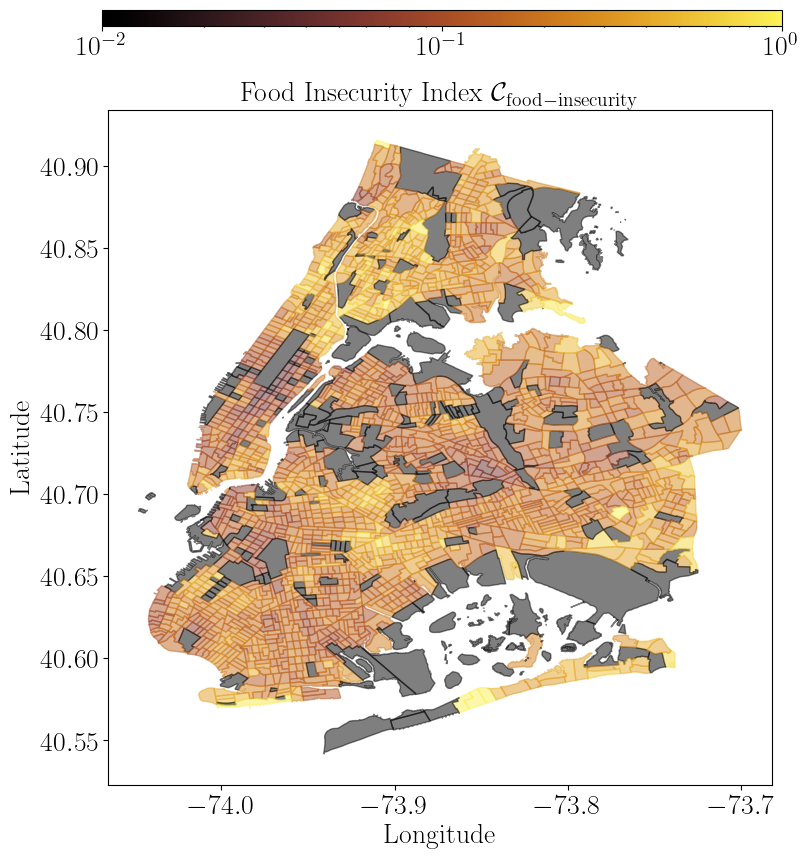

In [53]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(8,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')
cmap1 = matplotlib.cm.get_cmap('cmr.ember')
cmap2 = matplotlib.cm.get_cmap('cmr.cosmic')
#cmap3 = matplotlib.cm.get_cmap('cmr.toxic')
cmap3 = matplotlib.cm.get_cmap('cmr.amber')

normalize3 = matplotlib.colors.LogNorm(vmin=1e-2, vmax=1e0)

dummy=0
for i in range(0, len(GEO_AREAS)):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(GEO_NTACODE[i][-2:]!='99'):
                food_insecurity = FOOD_INSECURITY_INDEX[dummy]
                dummy+=1
                ax.fill(xs, ys, alpha=0.5, color=cmap3(normalize3(food_insecurity)))
            #valid_points.extend(filter(geom.contains, points))
            #print(latmin, np.min(ys))
            #geom.bounds#longmin
            #print(valid_points)#, points, xgrid, ygrid)
            else:
                ax.fill(xs, ys, alpha=0.5, color='black')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)
print(len(FOOD_INSECURITY_INDEX))
ax.set_title(r"$\text{Food Insecurity Index } \mathcal{C}_{\rm food-insecurity}$", fontsize=universal_fontsize)
ax.set_xlabel("Longitude", fontsize=universal_fontsize)
ax.set_ylabel("Latitude", fontsize=universal_fontsize)
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
cb_ax3 = fig.add_axes([0.135, 1.05, 0.85, 0.02])
cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap3,norm=matplotlib.colors.LogNorm(vmin=1e-2, vmax=1e0),orientation='horizontal')
#cbar=plt.colorbar(histoplot, cax=cb_ax, orientation='vertical')#, ticks=[1e11, 1e12, 1e13, 1e14, 1e15, 1e16])
#cbar.set_label(label=cblab, size=universal_fontsize)
#    cbar.ax.tick_params(labelsize=universal_fontsize)
#ax.text(-73.65, 40.8, "test", color="white")
print("Done")

### look for correlations between $\mathcal{C}_{\rm food-insecurity}$ and disease prevalence using CDC data

In [54]:
BORO_FIPS_AND_CODES = {
    "061": 1, #NY
    "005": 2, #BX
    "047": 3, #BK
    "081": 4, #QU
    "085": 5 #SI
}

DISEASES_NAMES_LEGIBLE={"ACCESS2": "Healthcare Access", "ARTHRITIS": "Arthritis", "BINGE":"Binge Eating",
                       "BPHIGH":"High Blood Pressure", "BPMED":"Taking Blood Pressure Medication",
                       "CANCER":"Cancer", "CASTHMA":"Athsma", "CHD":"Coronary Heart Disease", 
                        "CHECKUP":"Routine Checkups", "CHOLSCREEN":"Cholesterol Screening", 
                        "COLON":"Colon Screening","COPD":"Chronic Obstructive Pulmonary Disease",
                        "COREM":"Men up-to-date on Preventative Care",
                        "COREW":"Women up-to-date on Preventative Care",
                        "CSMOKING":"Smokers","DENTAL":"Visits to Dentist","DIABETES":"Diabetes",
                        "HIGHCHOL":"High Cholesterol","KIDNEY":"Chronic Kidney Disease",
                        "LPA":"No Leisure-time Physical Activity",
                        "MAMMOUSE":"Mammography Use","MHLTH":"Mental Health Not Good",
                        "OBESITY":"Obesity","PAPTEST":"Pap-smear","PHLTH":"Physical Health Not Good",
                        "SLEEP":"Sleeping less than 7 Hours",
                        "STROKE":"Stroke","TEETHLOST":"Teeth Lost"}

diseases_dataframe=pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/CDC_500Cities_CT.csv')
#print(diseases_dataframe)
CDC_STATES=np.asarray(diseases_dataframe['StateAbbr'])
CDC_CITIES=np.asarray(diseases_dataframe['PlaceName'])
#diseases_dataframe.where(CDC_CITIES=='New York')

NY_diseases_dataframe = diseases_dataframe.loc[diseases_dataframe['PlaceName'] == 'New York']
NY_CDC_TRACTFIPS = np.asarray(NY_diseases_dataframe['TractFIPS'])
NY_CDC_CT = []

for i in range(0, len(NY_CDC_TRACTFIPS)):
    cdc_fips = str(NY_CDC_TRACTFIPS[i])
    cdc_ct = cdc_fips[5:]
    cdc_borofips = cdc_fips[2:5]
    cdc_borocode = BORO_FIPS_AND_CODES[cdc_borofips]
    full_census_tract=int("%d%s"%(cdc_borocode,cdc_ct))
    #print(cdc_ct, cdc_borofips, cdc_borocode, full_census_tract)
    NY_CDC_CT.append(full_census_tract)

    
ailment_list = []
#ailment_list_parsed=[]
for i in range(6, len(diseases_dataframe.columns.values)-1,2):
    #print(diseases_dataframe.columns.values[i])
    ailmloc = diseases_dataframe.columns.values[i].split('_')
    ailment_list.append(ailmloc[0])
    print(int(i/2-3), ailmloc[0])
    #ailment_list_parsed.append()
AILMENTS_CONSIDERED = list(ailment_list)

0 ACCESS2
1 ARTHRITIS
2 BINGE
3 BPHIGH
4 BPMED
5 CANCER
6 CASTHMA
7 CHD
8 CHECKUP
9 CHOLSCREEN
10 COLON
11 COPD
12 COREM
13 COREW
14 CSMOKING
15 DENTAL
16 DIABETES
17 HIGHCHOL
18 KIDNEY
19 LPA
20 MAMMOUSE
21 MHLTH
22 OBESITY
23 PAPTEST
24 PHLTH
25 SLEEP
26 STROKE
27 TEETHLOST


2073
Done


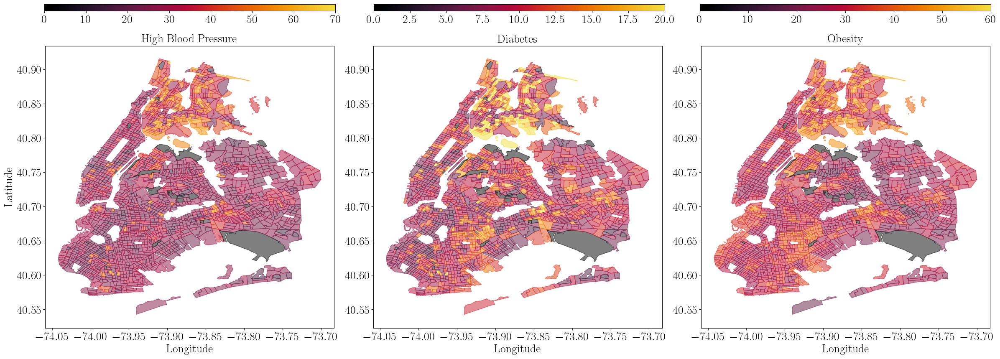

In [464]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=3,figsize=(24,8))
cmap1 = matplotlib.cm.get_cmap('cmr.ember')

#normalize1 = plt.Normalize(vmin=0.0, vmax=1000)
vmin_vmax = [[0, 70], [0, 20], [0, 60]]

#make a short list of ailments to considered based on their indices from above
AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[3],AILMENTS_CONSIDERED[16], AILMENTS_CONSIDERED[22]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[25],AILMENTS_CONSIDERED[26], AILMENTS_CONSIDERED[27]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[0],AILMENTS_CONSIDERED[1], AILMENTS_CONSIDERED[2]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[3],AILMENTS_CONSIDERED[4], AILMENTS_CONSIDERED[5]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[6],AILMENTS_CONSIDERED[7], AILMENTS_CONSIDERED[8]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[9],AILMENTS_CONSIDERED[10], AILMENTS_CONSIDERED[11]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[12],AILMENTS_CONSIDERED[13], AILMENTS_CONSIDERED[14]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[15],AILMENTS_CONSIDERED[16], AILMENTS_CONSIDERED[17]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[18],AILMENTS_CONSIDERED[19], AILMENTS_CONSIDERED[20]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[21],AILMENTS_CONSIDERED[22], AILMENTS_CONSIDERED[23]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[24],AILMENTS_CONSIDERED[25], AILMENTS_CONSIDERED[26]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[27]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[27],AILMENTS_CONSIDERED[28], AILMENTS_CONSIDERED[29]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[30],AILMENTS_CONSIDERED[31], AILMENTS_CONSIDERED[32]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[33],AILMENTS_CONSIDERED[34], AILMENTS_CONSIDERED[35]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[36],AILMENTS_CONSIDERED[37], AILMENTS_CONSIDERED[38]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[39],AILMENTS_CONSIDERED[40], AILMENTS_CONSIDERED[41]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[42],AILMENTS_CONSIDERED[43], AILMENTS_CONSIDERED[44]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[45],AILMENTS_CONSIDERED[46], AILMENTS_CONSIDERED[47]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[48],AILMENTS_CONSIDERED[49], AILMENTS_CONSIDERED[50]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[51],AILMENTS_CONSIDERED[52], AILMENTS_CONSIDERED[53]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[54],AILMENTS_CONSIDERED[55], AILMENTS_CONSIDERED[56]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[57],AILMENTS_CONSIDERED[58]]

#change between log notmalization or linear normalization
#AILMENT_NORMS = [matplotlib.colors.LogNorm(vmin=vmin_vmax[0][0], vmax=vmin_vmax[0][1]), 
#                 matplotlib.colors.LogNorm(vmin=vmin_vmax[1][0], vmax=vmin_vmax[1][1]),
#                 matplotlib.colors.LogNorm(vmin=vmin_vmax[2][0], vmax=vmin_vmax[2][1])]
AILMENT_NORMS = [plt.Normalize(vmin=vmin_vmax[0][0], vmax=vmin_vmax[0][1]), 
                 plt.Normalize(vmin=vmin_vmax[1][0], vmax=vmin_vmax[1][1]), 
                 plt.Normalize(vmin=vmin_vmax[2][0], vmax=vmin_vmax[2][1])]
AILMENT_DATA_PARSED=[[],[],[]]
for i in range(0, len(GEO_AREAS)):
#for i in range(0, 10):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    #if(GEO_BORONAME[i]=="Bronx"):
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
    #if(True):
        for j in range(0, len(AILMENTS_TO_CONSIDER)):
            ailment_name = AILMENTS_TO_CONSIDER[j]
            boro_census_tract=GEO_BOROCT2010[i]
            d_matching_index = np.where(NY_CDC_CT==boro_census_tract)[0]
            #print(ailment_name, d_matching_index)#, diseases_dataframe['# HEALTH & BEAUTY AIDS | AILMENTS/REMEDIES IN LAST 12 MONTHS | %s | HAVE NOT TREATED, 2022'%(ailment_name)].fillna(0)[d_matching_index])
            try:
                number_ailments=float(diseases_dataframe['%s_CrudePrev'%(ailment_name)].fillna(0)[d_matching_index])
            except:
                number_ailments=0.0
            
            for geom in MP.geoms:
                xs, ys = geom.exterior.xy
                if(GEO_NTACODE[i][-2:]!='99'):
                    ax[j].fill(xs, ys, alpha=0.5, color=cmap1(AILMENT_NORMS[j](number_ailments)))
                    AILMENT_DATA_PARSED[j].append(number_ailments)
                else:
                    continue

for j in range(0, len(AILMENTS_TO_CONSIDER)):
    ax[j].set_title("%s"%DISEASES_NAMES_LEGIBLE[AILMENTS_TO_CONSIDER[j]], fontsize=universal_fontsize)
    ax[j].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[0].set_ylabel("Latitude", fontsize=universal_fontsize)
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
cb_ax1 = fig.add_axes([0.047, 1.05, 0.29, 0.02])
#cb1 = cbar.ColorbarBase(cb_ax1, cmap=cmap1,norm=plt.Normalize(11e0, 100),orientation='horizontal')
cb1 = cbar.ColorbarBase(cb_ax1, cmap=cmap1,norm=plt.Normalize(vmin=vmin_vmax[0][0], vmax=vmin_vmax[0][1]), orientation='horizontal')

cb_ax2 = fig.add_axes([0.375, 1.05, 0.29, 0.02])
cb2 = cbar.ColorbarBase(cb_ax2, cmap=cmap1,norm=plt.Normalize(vmin=vmin_vmax[1][0], vmax=vmin_vmax[1][1]), orientation='horizontal')

cb_ax3 = fig.add_axes([0.7, 1.05, 0.29, 0.02])
cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap1,norm=plt.Normalize(vmin=vmin_vmax[2][0], vmax=vmin_vmax[2][1]),orientation='horizontal')
print(len(AILMENT_DATA_PARSED[0]))
print("Done")

(0.1514959608407081, 4.552690261019917e-11)
(0.1403876360071393, 1.0807085853422122e-09)
(0.14315140772137816, 5.026375703857547e-10)
Done


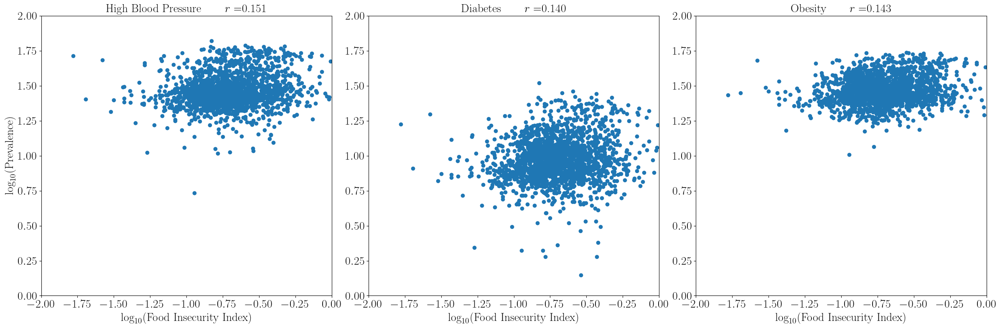

In [466]:
from scipy import stats as spstats
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=3,figsize=(24,8))

#print(np.isfinite(FOOD_INSECURITY_INDEX).all())
mask_invalid_entries=[i for i in range(0, len(FOOD_INSECURITY_INDEX)) if (not np.isfinite(FOOD_INSECURITY_INDEX[i]))]
#FOOD_INSECURITY_INDEX[mask_invalid_entries]=0.0
#print(FOOD_INSECURITY_INDEX[mask_invalid_entries], len(mask_invalid_entries))
FOOD_INSECURITY_MASKED=np.delete(FOOD_INSECURITY_INDEX, mask_invalid_entries)
PER_CAPITA_INCOME_MASKED=np.delete(PER_CAPITA_INCOME, mask_invalid_entries)
CTS_CONSIDERED_MASKED=np.delete(CTS_CONSIDERED, mask_invalid_entries)
AILMENT_DATA_MASKED=[]
for j in range(0, len(AILMENT_DATA_PARSED)):
    AILMENT_DATA_MASKED.append(np.delete(AILMENT_DATA_PARSED[j], mask_invalid_entries))

for i in range(0, len(AILMENTS_TO_CONSIDER)):
    #ax[i].scatter(AILMENT_DATA_PARSED[i], FOOD_INSECURITY_INDEX)
    ax[i].scatter(np.log10(FOOD_INSECURITY_MASKED), np.log10(AILMENT_DATA_MASKED[i]))
    #r=spstats.pearsonr(np.log10(FOOD_INSECURITY_MASKED), np.log10(AILMENT_DATA_MASKED[i]))
    r=spstats.pearsonr(FOOD_INSECURITY_MASKED, AILMENT_DATA_MASKED[i])
    print(r)
    ax[i].set_title(r"%s \hspace{1cm} $r=$%1.3f"%(DISEASES_NAMES_LEGIBLE[AILMENTS_TO_CONSIDER[i]], r[0]), fontsize=universal_fontsize)
    ax[i].set_xlim([-2, 0.0])
    ax[i].set_ylim([0, 2.0])
    
    #ax[i].set_yscale('log')
    #ax[i].set_xscale('log')
ax[0].set_xlabel(r'$\log_{10}($Food Insecurity Index)', fontsize=universal_fontsize)
ax[1].set_xlabel(r'$\log_{10}($Food Insecurity Index)', fontsize=universal_fontsize)
ax[2].set_xlabel(r'$\log_{10}($Food Insecurity Index)', fontsize=universal_fontsize)
ax[0].set_ylabel(r'$\log_{10}($Prevalence)', fontsize=universal_fontsize)

print("Done")

# Clustering

### Consider clustering in relevant quantities, including $C_{\rm swamp}$, $C_{\rm desert}$, $C_{\rm expense}$, per-capita income, etc.

In [467]:
#X = np.array([[1, 2], [1, 4], [1, 0], [10, 2], [10, 4], [10, 0]])
#dftest = pandas.DataFrame(X, columns=['x0', 'x1'])
from sklearn.preprocessing import StandardScaler

#COMBINED_DATA = np.stack([FOOD_INSECURITY_INDEX, 
#                          PER_CAPITA_INCOME,#).T
#                          np.asarray(AILMENT_DATA_PARSED[0])]).T
                          #np.asarray(AILMENT_DATA_PARSED[1]), #]).T
                          #np.asarray(AILMENT_DATA_PARSED[2])]).T
COMBINED_DATA = np.stack([FOOD_INSECURITY_MASKED,
                          PER_CAPITA_INCOME_MASKED,
                          np.asarray(AILMENT_DATA_MASKED[0]),  #]).T
                          np.asarray(AILMENT_DATA_MASKED[1]), #]).T
                          np.asarray(AILMENT_DATA_MASKED[2])  ]).T
#print(FOOD_SWAMP_INDEX_NORM.shape, FOOD_DESERT_INDEX_NORM.shape, FOOD_AFFORDABILITY_INDEX_NORM.shape,
#     np.asarray(AILMENT_DATA_PARSED[0]).shape, np.asarray(PER_CAPITA_INCOME).shape)
#print(X.shape, xtest.shape, Y.shape)
COMBINED_DATA_PARSED = np.nan_to_num(COMBINED_DATA, copy=True, nan=0.0, posinf=10.0, neginf=-1e100)
#COMBINED_DATA_DF = pandas.DataFrame(COMBINED_DATA_PARSED, columns=['food insecurity index', 'high blood pressure', 'athsma', 'diabetes'])
COMBINED_DATA_DF = pandas.DataFrame(COMBINED_DATA_PARSED, columns=['food swamp index', 'pci', 'ailment0', 'ailment1', 'ailment2'])
COMBINED_DATA_DF_SCALED = COMBINED_DATA_DF.copy()
COMBINED_DATA_DF_SCALED[COMBINED_DATA_DF.columns] = StandardScaler().fit_transform(COMBINED_DATA_DF)
print(COMBINED_DATA_DF)

      food swamp index           pci  ailment0  ailment1  ailment2
0             0.100574   9491.456611      27.7       8.4      27.6
1             0.049662   6659.875194      23.5       7.1      30.2
2             0.026469  13859.582814      48.2      19.8      47.8
3             0.167759   1844.310145      20.3       6.6      28.0
4             0.037163  15481.912800      24.2       7.3      25.7
...                ...           ...       ...       ...       ...
1865          0.090216   3729.173428      22.6       7.9      24.5
1866          0.184967   2031.229404      30.9      12.0      33.5
1867          0.164409   2152.473488      29.5      10.9      32.0
1868          0.505953   3683.467947      32.9      10.5      26.9
1869          0.256662   4434.894678      33.9      10.8      26.4

[1870 rows x 5 columns]


In [468]:
from sklearn.cluster import KMeans

kmeans_inertia=[]
cluster_numbers=range(1,7)
#find a good number of clusters
for i in cluster_numbers:
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10)
    kmeans.fit(COMBINED_DATA_DF)
    #kmeans.labels_
    kmeans_inertia.append(kmeans.inertia_)
#ax.plot(range(1,7), np.log10(wcss))


Text(0, 0.5, 'kmeans inertia')

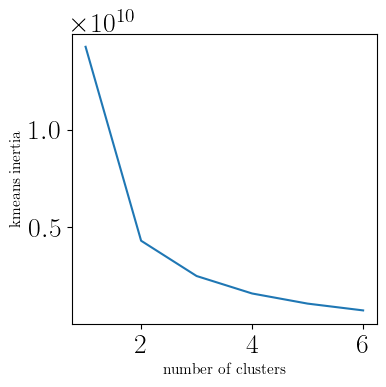

In [469]:
#use the elbow method to find optimal number of clusters
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(4,4))
ax.plot(cluster_numbers, kmeans_inertia)
ax.set_xlabel(r'number of clusters')
ax.set_ylabel(r'kmeans inertia')

In [490]:
from sklearn.cluster import DBSCAN
#using 2-3 clusters
kmeans = KMeans(n_clusters=3, random_state=0).fit(COMBINED_DATA_DF)
kmeans_labels=kmeans.labels_
kmeans_centers=kmeans.cluster_centers_

dbscab = DBSCAN(eps=5.0, min_samples=20)
dbscan_labels=dbs_combined_data.fit_predict(COMBINED_DATA_DF)

#print(len(labels), centers.shape)
print(set(kmeans_labels))
print(set(dbscan_labels))
print(kmeans_centers)
#ax.scatter(COMBINED_DATA_DF[labels==-1, 0], COMBINED_DATA_DF[labels==-1, 1])

{0, 1, 2}
{-1}
[[1.55998266e-01 5.51238582e+03 2.83506173e+01 9.05679012e+00
  2.89697531e+01]
 [1.10664070e-01 1.22390319e+04 2.84880342e+01 8.95555556e+00
  2.84136752e+01]
 [2.55580746e-01 2.46893788e+03 3.06541638e+01 1.04823653e+01
  3.05289713e+01]]


### extract the cluster labels from the kmeans calculation

In [491]:
label_cond=[]
for i in range(0, 4):
    condition = kmeans_labels==i
    #condition = dbscan_labels==i
    label_cond.append(np.where(condition))
#filtered_arr = arr[greater_than_two]

#np.where(labels==0, COMBINED_DATA_PARSED)
#print(len(COMBINED_DATA_PARSED[label0]))
#print(COMBINED_DATA_PARSED.T.shape)
print(len(COMBINED_DATA_PARSED.T[0][label_cond[0]]), len(COMBINED_DATA_PARSED.T[0][label_cond[1]]), len(COMBINED_DATA_PARSED.T[0][label_cond[2]]), len(COMBINED_DATA_PARSED.T[0][label_cond[3]]))

323 117 1430 0


### visualize the clustering

1870 1870


Text(0.5, 0, 'High Blood Pressure Prevalence')

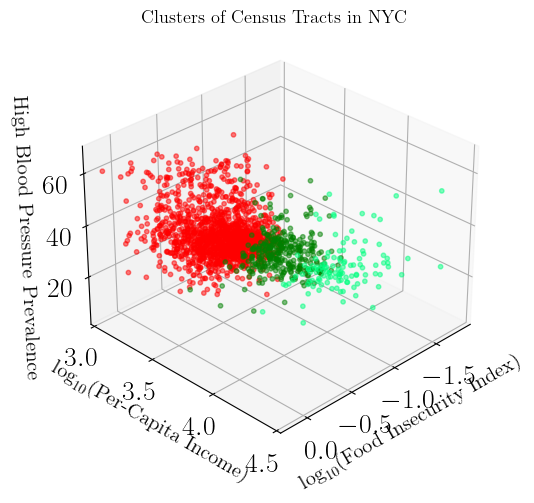

In [518]:
#fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(4,4))
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

#ax.scatter(np.log10(COMBINED_DATA_PARSED.T[0]), COMBINED_DATA_PARSED.T[2])
print(len(FOOD_INSECURITY_MASKED), len(AILMENT_DATA_MASKED[0]))

ax.scatter(np.asarray(np.log10(FOOD_INSECURITY_MASKED))[label_cond[0]], np.asarray(np.log10(PER_CAPITA_INCOME_MASKED))[label_cond[0]], np.asarray(AILMENT_DATA_MASKED[0])[label_cond[0]], alpha=0.5, color='green', s=10, zorder=10)
ax.scatter(np.asarray(np.log10(FOOD_INSECURITY_MASKED))[label_cond[1]], np.asarray(np.log10(PER_CAPITA_INCOME_MASKED))[label_cond[1]], np.asarray(AILMENT_DATA_MASKED[0])[label_cond[1]], alpha=0.5, color='springgreen', s=10, zorder=10)
ax.scatter(np.asarray(np.log10(FOOD_INSECURITY_MASKED))[label_cond[2]], np.asarray(np.log10(PER_CAPITA_INCOME_MASKED))[label_cond[2]], np.asarray(AILMENT_DATA_MASKED[0])[label_cond[2]], alpha=0.5, color='red', s=10, zorder=10)

ax.set_ylim3d([3,4.5])
ax.view_init(30, 45)
ax.set_title(r'Clusters of Census Tracts in NYC')
ax.set_xlabel(r'$\log_{10}$(Food Insecurity Index)', fontsize=universal_fontsize-5)
ax.set_ylabel(r'$\log_{10}$(Per-Capita Income)', fontsize=universal_fontsize-5)
ax.set_zlabel(r'High Blood Pressure Prevalence', fontsize=universal_fontsize-5)

2073
Done


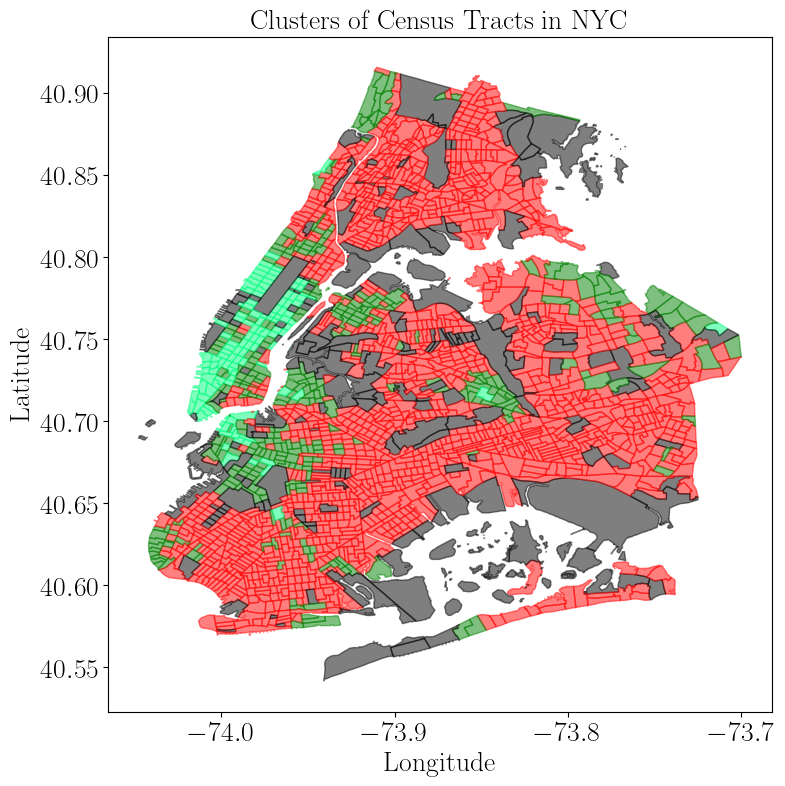

In [521]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=1,figsize=(8,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')
cmap1 = matplotlib.cm.get_cmap('cmr.ember')
cmap2 = matplotlib.cm.get_cmap('cmr.cosmic')
#cmap3 = matplotlib.cm.get_cmap('cmr.toxic')
cmap3 = matplotlib.cm.get_cmap('cmr.amber')

normalize3 = matplotlib.colors.LogNorm(vmin=1e-2, vmax=1e0)

dummy=0
for i in range(0, len(GEO_AREAS)):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    boro_census_tract=GEO_BOROCT2010[i]
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
        for geom in MP.geoms:
            xs, ys = geom.exterior.xy
            if(boro_census_tract in CTS_CONSIDERED_MASKED[label_cond[0]]):
                ax.fill(xs, ys, alpha=0.5, color='green')
            elif(boro_census_tract in CTS_CONSIDERED_MASKED[label_cond[1]]):
                ax.fill(xs, ys, alpha=0.5, color='springgreen')
            elif(boro_census_tract in CTS_CONSIDERED_MASKED[label_cond[2]]):
                ax.fill(xs, ys, alpha=0.5, color='red')
            else:
                ax.fill(xs, ys, alpha=0.5, color='black')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)
print(len(FOOD_INSECURITY_INDEX))
ax.set_title(r"$\text{Clusters of Census Tracts in NYC}$", fontsize=universal_fontsize)
ax.set_xlabel("Longitude", fontsize=universal_fontsize)
ax.set_ylabel("Latitude", fontsize=universal_fontsize)
print("Done")

#### principal component analysis

In [245]:
from sklearn.decomposition import PCA

#principal_components = PCA(n_components=len(COMBINED_DATA[0]))
ncomp=2
principal_components = PCA(n_components=ncomp)

PCA_result = principal_components.fit_transform(COMBINED_DATA_DF_SCALED)
print('Explained variation per principal component: {}'.format(principal_components.explained_variance_ratio_))

print('Cumulative variance explained by %d principal components: {:.2%}'.format(ncomp, np.sum(principal_components.explained_variance_ratio_)))

dataset_pca = pandas.DataFrame(abs(principal_components.components_), columns=COMBINED_DATA_DF_SCALED.columns, index=['PC1', 'PC2'])
print('\n\n', dataset_pca)

Explained variation per principal component: [0.59815432 0.25009502]
Cumulative variance explained by %d principal components: 200.00%


      food insecurity index  high blood pressure    athsma  diabetes
PC1               0.017749             0.604631  0.514348  0.607908
PC2               0.999056             0.019259  0.024207  0.030496


### look for correlations between $\mathcal{C}_{\rm food-insecurity}$ and disease prevalence using consumer data

In [394]:
diseases_dataframe=pandas.read_csv('/home/pedro/Singularity/Desktop/DS/FoodDeserts/All_Ailments_NYC.csv')


AILMENTS_CT_NAME=np.asarray(diseases_dataframe['Name'])
AILMENTS_CT=[]
BORO_NAMES_AND_CODES = {
    "New York": 1,
    "Bronx": 2,
    "Kings": 3,
    "Queens": 4,
    "Richmond": 5
}

for i in range(0, len(AILMENTS_CT_NAME)):
    d_ct=AILMENTS_CT_NAME[i].split(',')[0][2:]
    #full_census_tract=ca_ct
    d_boroname = AILMENTS_CT_NAME[i].split(',')[1][1:-7]
    d_borocode = BORO_NAMES_AND_CODES[d_boroname]
    full_census_tract = int("%d%s"%(d_borocode, d_ct))
    neighborhood_indices = np.where(GEO_BOROCT2010 == full_census_tract)[0]
    
    AILMENTS_CT.append(full_census_tract)
    
    #print(CARACCESS_NAME[i], GEO_NTANAME[neighborhood_indices], GEO_BOROCT2010[neighborhood_indices], "---", full_census_tract, CARACCESS_VEHICLES[i])
    #print(ca_boroname, ca_ct, full_census_tract)
AILMENTS_CT=np.array(AILMENTS_CT)
#print("Done", len(CARACCESS_CT), len(CARACCESS_VEHICLES),np.min(PERCAP_INC_BY_CT), np.max(PERCAP_INC_BY_CT))
#for i in range(0, len(GEO_BOROCT2010)):
#    print(GEO_BOROCT2010[i])
#    if(GEO_CT2010[i]==400):
#        print(GEO_NTANAME[i])
#print(GEO_CT2010, CARACCESS_CT, GEO_BOROCT2010)




ailment_list = []
#ailment_list_parsed=[]
for i in range(2, len(diseases_dataframe.columns.values),2):
    ailmloc = diseases_dataframe.columns.values[i].split('|')
    ailment_list.append(ailmloc[2][1:-1])
    print(int(i/2-1), ailmloc[2][1:-1])
    #ailment_list_parsed.append()
AILMENTS_CONSIDERED = list(ailment_list)
AILMENTS_DATA = [[],[]]

#print(shape(DISEASES))
for i in range(0, len(AILMENTS_CONSIDERED)):
    AILMENTS_DATA[0].append(np.asarray(diseases_dataframe['# HEALTH & BEAUTY AIDS | AILMENTS/REMEDIES IN LAST 12 MONTHS | %s | HAVE NOT TREATED, 2022'%(AILMENTS_CONSIDERED[i])]))
    AILMENTS_DATA[1].append(np.asarray(diseases_dataframe['# HEALTH & BEAUTY AIDS | AILMENTS/REMEDIES IN LAST 12 MONTHS | %s | HAVE/HAD, 2022'%(AILMENTS_CONSIDERED[i])]))
mAILMENTS_DATA = np.ma.masked_invalid(AILMENTS_DATA)
np.ma.set_fill_value(mAILMENTS_DATA, 0.0)
mAILMENTS_DATA=mAILMENTS_DATA.filled(0.0)
print(len(AILMENTS_DATA[0][0]))
#AILMENTS_DA
#for j in range(0, len(DISEASES[0][0])):

0 DIABETES (TYPE 2-NON-INSULIN DEPENDENT)
1 OBESITY/OVERWEIGHT
2 CANCER
3 HEART ATTACK/HEART DISEASE
4 OSTEOPOROSIS
5 HYPERTENSION/HIGH BLOOD PRESSURE
6 GOUT
7 ROSACEA OR SKIN DISEASE
8 PROSTATE DISEASE (MEN ONLY)
9 CONSTIPATION
10 DEPRESSION
11 ECZEMA/SKIN ITCH/RASH
12 HEARTBURN/ACID REFLUX
13 HIGH CHOLESTEROL
14 INSOMNIA
15 IRRITABLE BOWEL SYNDROME (IBS)
16 KIDNEY AILMENTS
17 MIGRAINE HEADACHES
18 OVERACTIVE BLADDER
19 RESTLESS LEGS SYNDROME
20 PSORIASIS
21 SINUS CONGESTION/HEADACHE
22 SLEEP APNEA
23 SNORING
24 URINARY TRACT INFECTION (UTI)
25 YEAST INFECTION (WOMEN ONLY)
26 ACNE
27 ADD/ADHD
28 ALLERGY/HAY FEVER
29 ANXIETY/PANIC
30 ARTHRITIS/OSTEOARTHRITIS
31 ARTHRITIS/RHEUMATOID ARTHRITIS (RA)
32 ASTHMA
33 ATHLETE'S FOOT
34 ATRIAL FIBRILLATION (AFIB)
35 BACKACHE/BACK PAIN
36 BIPOLAR DISORDER
37 CATARACTS
38 CHRONIC BRONCHITIS
39 CHRONIC/SEVERE PAIN
40 COLD SORES
41 CROHN'S DISEASE/ULCERATIVE COLITIS
42 DANDRUFF/DRY SCALP
43 DIABETES (TYPE 1-INSULIN DEPENDENT)
44 DRY EYES
45 EMPHYSEM

2073
Done


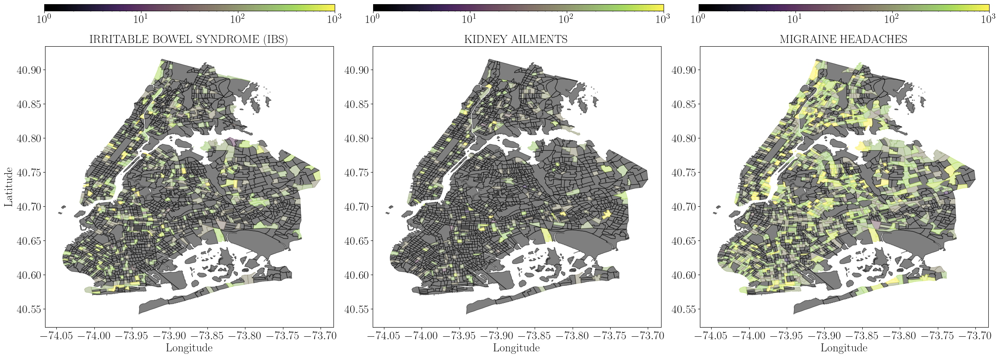

In [411]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=3,figsize=(24,8))
#cmap = matplotlib.cm.get_cmap('cmr.tropical')
cmap1 = matplotlib.cm.get_cmap('cmr.ghostlight')
#cmap2 = matplotlib.cm.get_cmap('cmr.ember')
#cmap3 = matplotlib.cm.get_cmap('cmr.ember')
#cmap2 = matplotlib.cm.get_cmap('cmr.cosmic')
#cmap3 = matplotlib.cm.get_cmap('cmr.toxic')

#normalize1 = plt.Normalize(vmin=0.0, vmax=1000)
vmin_vmax = [[1e0, 1e3], [1e0, 1e3], [1e0, 1e3]]
#normalize1 = matplotlib.colors.LogNorm(vmin=vmin_vmax[0][0], vmax=vmin_vmax[0][1])
#normalize2 = plt.Normalize(vmin=0.0, vmax=100)
#normalize3 = plt.Normalize(vmin=0.0, vmax=100)
#normalize2 = plt.Normalize(vmin=0.0, vmax=2e4)
#then, highlight all (sub)neighborhoods in that neighborhood
#AILMENTS_TO_CONSIDER = ['DIABETES', 'OBESITY', 'HEART']
#AILMENTS_TO_CONSIDER = ['DIABETES (TYPE 2-NON-INSULIN DEPENDENT)', 'OBESITY/OVERWEIGHT', 'CANCER']

#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[0],AILMENTS_CONSIDERED[1], AILMENTS_CONSIDERED[2]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[3],AILMENTS_CONSIDERED[4], AILMENTS_CONSIDERED[5]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[6],AILMENTS_CONSIDERED[7], AILMENTS_CONSIDERED[8]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[9],AILMENTS_CONSIDERED[10], AILMENTS_CONSIDERED[11]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[12],AILMENTS_CONSIDERED[13], AILMENTS_CONSIDERED[14]]
AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[15],AILMENTS_CONSIDERED[16], AILMENTS_CONSIDERED[17]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[18],AILMENTS_CONSIDERED[19], AILMENTS_CONSIDERED[20]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[21],AILMENTS_CONSIDERED[22], AILMENTS_CONSIDERED[23]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[24],AILMENTS_CONSIDERED[25], AILMENTS_CONSIDERED[26]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[27],AILMENTS_CONSIDERED[28], AILMENTS_CONSIDERED[29]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[30],AILMENTS_CONSIDERED[31], AILMENTS_CONSIDERED[32]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[33],AILMENTS_CONSIDERED[34], AILMENTS_CONSIDERED[35]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[36],AILMENTS_CONSIDERED[37], AILMENTS_CONSIDERED[38]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[39],AILMENTS_CONSIDERED[40], AILMENTS_CONSIDERED[41]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[42],AILMENTS_CONSIDERED[43], AILMENTS_CONSIDERED[44]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[45],AILMENTS_CONSIDERED[46], AILMENTS_CONSIDERED[47]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[48],AILMENTS_CONSIDERED[49], AILMENTS_CONSIDERED[50]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[51],AILMENTS_CONSIDERED[52], AILMENTS_CONSIDERED[53]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[54],AILMENTS_CONSIDERED[55], AILMENTS_CONSIDERED[56]]
#AILMENTS_TO_CONSIDER = [AILMENTS_CONSIDERED[57],AILMENTS_CONSIDERED[58]]

AILMENT_NORMS = [matplotlib.colors.LogNorm(vmin=vmin_vmax[0][0], vmax=vmin_vmax[0][1]), 
                 matplotlib.colors.LogNorm(vmin=vmin_vmax[1][0], vmax=vmin_vmax[1][1]),
                 matplotlib.colors.LogNorm(vmin=vmin_vmax[2][0], vmax=vmin_vmax[2][1])]

AILMENT_DATA_PARSED=[[],[],[]]
for i in range(0, len(GEO_AREAS)):
#for i in range(0, 10):
    valid_points=[]
    MP = shapely.wkt.loads(GEO_AREAS[i])
    #if(GEO_BORONAME[i]=="Bronx"):
    if(GEO_BORONAME[i] in BOROUGHS_TO_CONSIDER):
    #if(True):
        for j in range(0, len(AILMENTS_TO_CONSIDER)):
            ailment_name = AILMENTS_TO_CONSIDER[j]
            boro_census_tract=GEO_BOROCT2010[i]
            d_matching_index = np.where(CARACCESS_CT==boro_census_tract)[0]
            #print(ailment_name, d_matching_index)#, diseases_dataframe['# HEALTH & BEAUTY AIDS | AILMENTS/REMEDIES IN LAST 12 MONTHS | %s | HAVE NOT TREATED, 2022'%(ailment_name)].fillna(0)[d_matching_index])
            try:
                number_untreated=float(diseases_dataframe['# HEALTH & BEAUTY AIDS | AILMENTS/REMEDIES IN LAST 12 MONTHS | %s | HAVE NOT TREATED, 2022'%(ailment_name)].fillna(0)[d_matching_index])
            except:
                number_untreated=0.0
            try:
                number_treated=float(diseases_dataframe['# HEALTH & BEAUTY AIDS | AILMENTS/REMEDIES IN LAST 12 MONTHS | %s | HAVE/HAD, 2022'%(ailment_name)].fillna(0)[d_matching_index])
            except:
                number_treated=0.0
            number_ailments = number_treated + number_untreated
            
            for geom in MP.geoms:
                xs, ys = geom.exterior.xy
                if(GEO_NTACODE[i][-2:]!='99'):
                    ax[j].fill(xs, ys, alpha=0.5, color=cmap1(AILMENT_NORMS[j](number_ailments)))
                    AILMENT_DATA_PARSED[j].append(number_ailments)
                    #ax[1].fill(xs, ys, alpha=0.5, color=cmap2(normalize2(population_in_ct)))
                    #ax[2].fill(xs, ys, alpha=0.5, color=cmap3(normalize3(percap_inc_in_ct)))
                #valid_points.extend(filter(geom.contains, points))
                #print(latmin, np.min(ys))
                #geom.bounds#longmin
                #print(valid_points)#, points, xgrid, ygrid)
                else:
                    ax[j].fill(xs, ys, alpha=0.5, color='black')
            #ax.plot(valid_points)
            #ax.scatter(valid_points)

ax[0].set_title("%s"%AILMENTS_TO_CONSIDER[0], fontsize=universal_fontsize)
ax[1].set_title("%s"%AILMENTS_TO_CONSIDER[1], fontsize=universal_fontsize)
ax[2].set_title("%s"%AILMENTS_TO_CONSIDER[2], fontsize=universal_fontsize)
ax[0].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[1].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[2].set_xlabel("Longitude", fontsize=universal_fontsize)
ax[0].set_ylabel("Latitude", fontsize=universal_fontsize)
#fig.colorbar(pct_cars, cax=ax, orientation='vertical');
cb_ax1 = fig.add_axes([0.047, 1.05, 0.29, 0.02])
#cb1 = cbar.ColorbarBase(cb_ax1, cmap=cmap1,norm=plt.Normalize(11e0, 100),orientation='horizontal')
cb1 = cbar.ColorbarBase(cb_ax1, cmap=cmap1,norm=matplotlib.colors.LogNorm(vmin=vmin_vmax[0][0], vmax=vmin_vmax[0][1]), orientation='horizontal')

cb_ax2 = fig.add_axes([0.375, 1.05, 0.29, 0.02])
cb2 = cbar.ColorbarBase(cb_ax2, cmap=cmap1,norm=matplotlib.colors.LogNorm(vmin=vmin_vmax[1][0], vmax=vmin_vmax[1][1]), orientation='horizontal')

cb_ax3 = fig.add_axes([0.7, 1.05, 0.29, 0.02])
cb3 = cbar.ColorbarBase(cb_ax3, cmap=cmap1,norm=matplotlib.colors.LogNorm(vmin=vmin_vmax[2][0], vmax=vmin_vmax[2][1]),orientation='horizontal')
print(len(AILMENT_DATA_PARSED[0]))
print("Done")

2073 2073
Done


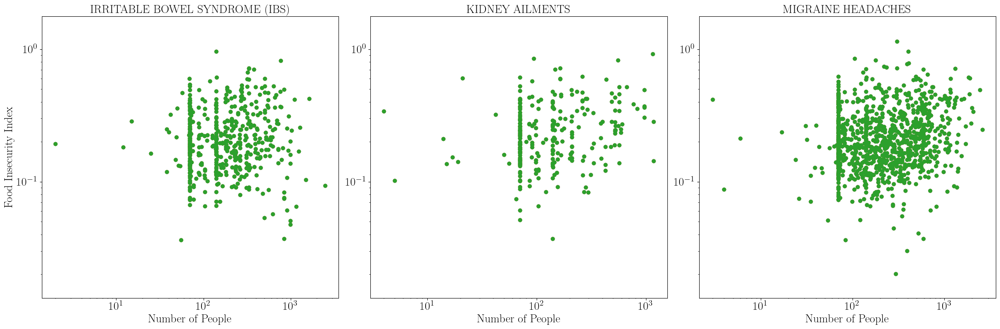

In [412]:
from matplotlib.ticker import LogFormatter 
fig, ax= plt.subplots(nrows=1, ncols=3,figsize=(24,8))

print(len(FOOD_INSECURITY_INDEX), len(AILMENT_DATA_PARSED[0]))
for i in range(0, len(AILMENTS_TO_CONSIDER)):
    ax[i].scatter(AILMENT_DATA_PARSED[i], FOOD_INSECURITY_INDEX)
    ax[i].scatter(AILMENT_DATA_PARSED[i], FOOD_INSECURITY_INDEX)
    ax[i].scatter(AILMENT_DATA_PARSED[i], FOOD_INSECURITY_INDEX)

    ax[i].set_title("%s"%AILMENTS_TO_CONSIDER[i], fontsize=universal_fontsize)
    
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
ax[0].set_ylabel('Food Insecurity Index', fontsize=universal_fontsize)
ax[0].set_xlabel('Number of People', fontsize=universal_fontsize)
ax[1].set_xlabel('Number of People', fontsize=universal_fontsize)
ax[2].set_xlabel('Number of People', fontsize=universal_fontsize)
#ax[0].set_title("%s"%AILMENTS_TO_CONSIDER[0], fontsize=universal_fontsize)
#ax[1].set_title("%s"%AILMENTS_TO_CONSIDER[1], fontsize=universal_fontsize)
#ax[2].set_title("%s"%AILMENTS_TO_CONSIDER[2], fontsize=universal_fontsize)
#ax[0].set_xlabel("Longitude", fontsize=universal_fontsize)
#ax[1].set_xlabel("Longitude", fontsize=universal_fontsize)
#ax[2].set_xlabel("Longitude", fontsize=universal_fontsize)
#ax[0].set_ylabel("Latitude", fontsize=universal_fontsize)



print("Done")

In [295]:
from difflib import SequenceMatcher

def similar_strings(a, b):
    return SequenceMatcher(None, a, b).ratio()

NYC_SUPERMARKETS=[]
NYC_SUPERMARKET_indices=[]
NYC_SUPERMARKET_coords=[]
print("cross-referencing supermarket lists...")
for i in range(0, len(SUPERMARKET_ADDRESSES_web)):
    addy=SUPERMARKET_ADDRESSES_web[i]
    zippy=SUPERMARKET_ZIPCODES_web[i]
    #for each address from the website, see if you can cross-reference it to one in the NYC database
    for s in range(0, len(NYC_FOODSTORE_ADDRESSFULL)):
        reference_address=NYC_FOODSTORE_ADDRESSFULL[s]
        reference_coords=NYC_FOODSTORE_COORDS[s]
        #if(similar_strings(addy[:8],reference_address[:8]) > 0.88):
        #    print(i, addy, "===", reference_address)
        #    NYC_SUPERMARKETS.append(reference_address)
        #    NYC_SUPERMARKET_indices.append(s)
        #focus on comparing the beginning of each address, as the ends can be inconsisten 
        #(e.g., "St." vs "Street" vs "St")
        if addy[:8] in reference_address[:8]:
            if(reference_address) not in NYC_SUPERMARKETS:
                #print(i, addy, "===", reference_address)
                NYC_SUPERMARKETS.append(reference_address)
                NYC_SUPERMARKET_indices.append(s)
                NYC_SUPERMARKET_coords.append(reference_coords)
    #print(i, addy, "===", reference_address)
print("Done", len(NYC_SUPERMARKETS))
#print()
#TODO, where did all the 576 supermarkets go??? Must be small inconsistencies between addresses or old ones. 
#for example one store listed at 114 Cozine Ave in one database has apparently moved to or is 
#listed at 112 Cozine Ave in another database

cross-referencing supermarket lists...
Done 244
